<b><center><font size="20">A machine learning approach to rapidly project climate responses under a multitude of net-zero emission pathways</font></center></b>

<center><font size="10">Vassili Kitsios, Terence J. O'Kane & David Newth</font></center>

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

/var/folders/db/7grfv5yd61j8qsltmksjkgrc0000gp/T/ipykernel_11979/82325636.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


# Front matter

In [3]:
%matplotlib inline
# %matplotlib

In [4]:
# Loading libaries
import datetime
import os
import sys
import copy
import string
import glob

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import colors 

import cartopy as cart
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

import pandas as pd
import xarray as xr

import numpy as np
import scipy 

import importlib

In [5]:
cwd = os.getcwd()
src_dir = cwd+'/src/'
data_dir = cwd+'/inputs/'
results_dir = cwd+'/results/'
images_dir = cwd+'/images/'

In [6]:
sys.path.append(src_dir+'/fembv-models')
from fembv_models import FEMBVVARX
from fembv_models.fembv_varx import (
    _compute_covariances,
    _compute_precision_cholesky,
)
from fembv_models import model_selection

In [7]:
# plot settings
plt.rcParams['savefig.dpi'] = 75
plt.rcParams['figure.autolayout'] = False
plt.rcParams['figure.figsize'] = (21, 30)  # A4
plt.rcParams['lines.linewidth'] = 2.0
plt.rcParams['lines.markersize'] = 8
plt.rcParams['font.size'] = 20
plt.rcParams['xtick.major.pad']=12
plt.rcParams['ytick.major.pad']=12

# Helper Functions

## Plotting

In [13]:
def generate_colours_dict(keys):
    colours = dict()
    num_colours = len(keys)
    for ii,key in enumerate(keys):
        hue = 1.0*ii/num_colours
        colours[key] = matplotlib.colors.hsv_to_rgb([hue,1,1])
    return colours

In [14]:
def plot_field(field, lon=None, lat=None, num_contours=8, minC=None, maxC=None, cmap=plt.cm.coolwarm):
    Nlon,Nlat = np.shape(field) 
    if lon is None:
        lon = np.linspace(0,360,Nlon)
    if lat is None:
        lat = np.linspace(-90,90,Nlat)        
        
    field_plot = copy.deepcopy(field.T)
    if maxC!=None and minC!=None and minC<maxC: 
        field_plot = np.clip(field_plot,minC+np.abs(minC)*1e-2,maxC-np.abs(maxC)*1e-2)
        cb_lev = np.linspace(minC,maxC,num_contours)
        h = plt.contourf(lon,lat,field_plot,cb_lev,cmap=cmap, transform=ccrs.PlateCarree())
    else:
        minC = np.nanmin(field_plot)
        maxC = np.nanmax(field_plot)
        if minC<0.0 and maxC>0.0:
            maxC = max(-minC, maxC)*0.8
            minC = -maxC
            field_plot = np.clip(field_plot,minC+np.abs(minC)*1e-2,maxC-np.abs(maxC)*1e-2)
            cb_lev = np.linspace(minC,maxC,num_contours)
            h = plt.contourf(lon,lat,field_plot,cb_lev,cmap=cmap, transform=ccrs.PlateCarree())
        else:
            h = plt.contourf(lon,lat,field_plot,cmap=cmap, transform=ccrs.PlateCarree())
    
    return h

In [15]:
def add_plot_features(fig, h, ax, xticks=[-180,-120,-60,0,60,120], yticks=[-60, -30, 0, 30, 60], orientation='horizontal', tick_rotation=0, borders=True, coasts=True, cb_labelsize=None):
    if orientation is not None:
        cb = fig.colorbar(h, orientation=orientation)
        if cb_labelsize is not None:
            cb.ax.tick_params(labelsize=cb_labelsize)
        cb.ax.set_xticklabels(cb.ax.get_xticklabels(), rotation=tick_rotation)
    ax.set_xticks(xticks, crs=ccrs.PlateCarree())
    ax.set_yticks(yticks, crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
    if coasts:
        ax.coastlines(linewidth=2)
    if borders:
        ax.add_feature(cart.feature.BORDERS, zorder=100, edgecolor='k')
    plt.grid()

## Diagnostics

In [10]:
def nancorr(A_orig,B_orig):
    filt = ~np.isnan(A_orig*B_orig)
    A = A_orig[filt]
    B = B_orig[filt]
    cov = np.mean((A - np.mean(A))*(B - np.mean(B)))
    return cov/np.std(A)/np.std(B)

In [11]:
def calculate_WBGT(p_ref, T_ref, rh_ref, print_output=True):     
    """Calculate the Wet-Bulb Globe Temperature as in Newth & Gunasekera (2018, Atmosphere)  
    Inputs:
        p_ref   is the daily sea level pressure in mbar
        T_ref   is the daily 2m temperature in degrees Kelvin
        rh_ref  is the daily 2m relative humidity as a percentage 
        
    Local variables:
        T_a     is the daily 2m temperature in degrees Celcius
        T_L     is the daily 2m lifting condensation temperature in degrees Kelvin
        e_sat   is the daily 2m saturation vapour pressure in mbar
        w_sat   is the daily 2m saturation mixing ratio in g/kg
        w       is the daily 2m mixing ratio in g/kg
        theta_E is the daily temperature adiabatically relocated to 1000mbar in degrees Kelvin
        T_wbt   is the daily 2m natural wet bulb temperature in degrees Celcius
        
    Output variables:
        T_wbgt  is the daily 2m wet bulb globe temperature in degrees Celcius
    """
    
    T_wbgt = T_a = T_L = e_sat = w_sat = w = theta_E = T_wbt = rh_ref_clip = None
    rh_ref_clip = np.clip(rh_ref,0.01,100.0)
    T_a     = T_ref - 273.15
    T_L     = 1.0 / ( 1.0/(T_ref - 55) - np.log(rh_ref_clip/100.0)/2840.0 ) + 55.0 
    e_sat   = np.exp( -2991.2729/(T_ref**2.0) - 6017.0128/T_ref + 18.87643854 - 0.028354721*T_ref + (T_ref**2.0)*1.7838310e-5 - (T_ref**3.0)*8.4150417e-10 + (T_ref**4.0)*4.4412543e-13 + 2.858487*np.log(T_ref) ) / 100.0
    w_sat   = 621.97*e_sat/(p_ref-e_sat) 
    w       = rh_ref_clip / 100.0 * w_sat
    theta_E = T_ref * ( np.power(1000.0/p_ref, 0.2854*(1.0-w*0.28e-3) ) ) * np.exp( (3.376/T_L-0.00254) * w * (1.0 + w*0.81e-3) )
    T_wbt   = 45.114 - 51.489*np.power(theta_E/273.15, -3.504)
    T_wbgt  = 0.7*T_wbt + 0.3*T_a
        
    return T_wbgt, T_a, T_L, e_sat, w_sat, w, theta_E, T_wbt, rh_ref_clip

## Model Reduction

In [12]:
def calculate_EOF(A, weights=None, reciprocal_condition_number_threshold=1e-6):
    nt,nlat,nlon=np.shape(A)
    A_flat = copy.deepcopy(A)
    if weights is not None:
        A_flat_weighted = A_flat*np.sqrt(weights)
        A_flat = A_flat.reshape(nt,nlat*nlon)
        A_flat_weighted = A_flat_weighted.reshape(nt,nlat*nlon)
        C = np.dot(A_flat_weighted,A_flat_weighted.T)/nt
    else:
        A_flat = A_flat.reshape(nt,nlat*nlon)
        C = np.dot(A_flat,A_flat.T)/nt
    
    eigenvalues, eigenvectors = scipy.linalg.eigh(C)
    eigenvalues = eigenvalues[::-1]
    eigenvalues[np.isnan(eigenvalues)] = -1.0
    eigenvalues[np.isinf(eigenvalues)] = -1.0
    filt = eigenvalues/np.max(eigenvalues)>reciprocal_condition_number_threshold
    eigenvalues = eigenvalues[filt]
    num_modes = len(eigenvalues)
    
    eigenvectors = eigenvectors[:,::-1]
    eigenvectors = eigenvectors[:,filt]
    eigenvectors = eigenvectors / np.sqrt(np.mean(eigenvectors*eigenvectors,axis=0)) * np.sqrt(eigenvalues)
    
    modes = np.dot( np.dot(A_flat.T, eigenvectors), np.diag(1.0/eigenvalues) ) / nt
    modes = modes.reshape(nlat, nlon, num_modes)
    
    del C, A_flat
    
    print('num_modes = {0}'.format(num_modes))
    
    return eigenvalues, eigenvectors, modes

In [13]:
def perform_model_reduction(ds_model_anom, var_name_list):
    weights = ((ds_model_anom.isel(scenario=0).tas.isel(time=0)*0.0+1)*np.cos(ds_model_anom.lat/180.0*np.pi))
    weights = (weights/weights.sum('lat').sum('lon')).values

    nvar=len(var_name_list)
    for vv,var_name in enumerate(var_name_list):
        if var_name=='tas':
            scale_weights_by = 1.0
        else:
            scale_weights_by = 1.0/(nvar-1)

        if vv==0:
            weights_stack = weights*scale_weights_by
        else:
            weights_stack = np.vstack((weights_stack, weights*scale_weights_by))    

    for ii,scenario in enumerate(ds_model_anom.scenario.values):
        for jj,var_name in enumerate(var_name_list):
            this_var = ds_model_anom.sel(scenario=scenario)[var_name].values
            this_var[np.isnan(this_var)] = 0.0
            if jj==0:
                this_data = this_var
            else:
                this_data = np.hstack((this_data, this_var))
            del this_var

        if ii==0:
            A_stack = this_data
        else:
            A_stack = np.vstack((A_stack, this_data))

        del this_data

    eigenvalues, eigenvectors, modes = calculate_EOF(A_stack, reciprocal_condition_number_threshold=1e-6, weights=weights_stack)
    nvar_nlat, nlon, nmodes = np.shape(modes)
    nlat = int(nvar_nlat/nvar)
    modes = modes.reshape(nvar,nlat,nlon,nmodes)
    print('Shape of EOF modes = ', np.shape(modes))
    print('Shape of PCs = ', np.shape(eigenvectors))

    return eigenvalues, eigenvectors, modes

## Training

In [14]:
def get_exogenous_variable(u, years, first_year=2006, num_years=94, intervals='annual'):
    
    ind=first_year-years[0]
    u = u[ind:ind+num_years]
    
    if intervals == 'annual':
        u = np.expand_dims(u,axis=1)
        return u
    
    elif intervals == 'monthly':
        u_upsample = np.zeros((12*len(u)), dtype=float)
        u_upsample[:] = np.nan
        u_upsample[::12] = u
        
        ok = ~np.isnan(u_upsample)
        xp = ok.ravel().nonzero()[0]
        fp = u_upsample[~np.isnan(u_upsample)]
        x  = np.isnan(u_upsample).ravel().nonzero()[0]

        u_upsample[np.isnan(u_upsample)] = np.interp(x, xp, fp)

        u_upsample = np.expand_dims(u_upsample,axis=1)
        return u_upsample
    else:
        print('no such interval')
        sys.exit()

In [15]:
def calculate_temporal_parameters(model):

    num_samples_minus_num_lags = len(model.weights_[:,0])
    num_clusters, num_lags, num_endog, dummy = np.shape(model.endog_coef_)
    if model.exog_coef_ is not None:
        dummy1, dummy2, num_exog = np.shape(model.exog_coef_)
    else:
        num_exog = 0
    
    temporal_params = dict()
    temporal_params['means_time_']       = np.zeros((num_samples_minus_num_lags,num_endog),dtype=float)
    temporal_params['endog_coef_time_'] = np.zeros((num_samples_minus_num_lags,num_lags,num_endog,num_endog),dtype=float)
    temporal_params['exog_coef_time_']  = np.zeros((num_samples_minus_num_lags,num_endog,num_exog),dtype=float)
    for cc in range(0,num_clusters):
        for nn in range(0,num_endog):
            temporal_params['means_time_'][:,nn] += model.weights_[:,cc] * model.means_[cc,nn]
            if num_lags>0:
                for mm in range(0,num_endog):
                    for ll in range(0,num_lags):
                        temporal_params['endog_coef_time_'][:,ll,nn,mm] += model.weights_[:,cc] * model.endog_coef_[cc,ll,nn,mm]
            if num_exog>0:
                for xx in range(0,num_exog):
                    temporal_params['exog_coef_time_'][:,nn,xx] += model.weights_[:,cc] * model.exog_coef_[cc,nn,xx]
    
    return temporal_params

## Projection

In [16]:
def evaluate_model(temporal_parameters, X, u=None, local_forecast=True):
    
    num_samples = len(X[:,0])
    
    num_samples_minus_num_lags, num_lags, num_endog, dummy = np.shape(temporal_parameters['endog_coef_time_'])
    if temporal_parameters['exog_coef_time_'] is not None:
        dummy1, dummy2, num_exog = np.shape(temporal_parameters['exog_coef_time_'])
    else:
        num_exog = 0
    
    X_predict = np.zeros((num_samples, num_endog), dtype=float)
    
    if local_forecast:
        X_predict[0:num_lags,:] = np.nan
        for nn in range(0,num_endog):
            X_predict[num_lags:,nn] += temporal_parameters['means_time_'][:,nn]
            if num_lags>0: 
                for mm in range(0,num_endog):
                    for ll in range(0,num_lags):
                        X_predict[num_lags:,nn] += temporal_parameters['endog_coef_time_'][:,ll,nn,mm] * X[num_lags-ll-1:num_samples-ll-1,mm]
            if num_exog>0 and u is not None: 
                for xx in range(0,num_exog):
                    X_predict[num_lags:,nn] += temporal_parameters['exog_coef_time_'][:,nn,xx] * u[num_lags:,xx]

    else:
        X_predict[0:num_lags,:] = X[0:num_lags,:]
        for tt in range(num_lags,num_samples):
            for nn in range(0,num_endog):
                X_predict[tt,nn] += temporal_parameters['means_time_'][tt-num_lags,nn]
                if num_lags>0: 
                    for mm in range(0,num_endog):
                        for ll in range(0,num_lags):
                            X_predict[tt,nn] += temporal_parameters['endog_coef_time_'][tt-num_lags,ll,nn,mm] * X_predict[tt-ll-1,mm]
                if num_exog>0 and u is not None: 
                    for xx in range(0,num_exog):
                        X_predict[tt,nn] += temporal_parameters['exog_coef_time_'][tt-num_lags,nn,xx] * u[tt,xx]
        X_predict[0:num_lags,:] = np.nan
        
    return X_predict

In [17]:
def ma(a,window,fill=True,centering=True):
    a_out = a*0
    if centering:
        window=int(window/2)*2 # ensure even
        half_window=int(window/2)
        for ii in range(half_window,len(a)-half_window):
            a_out[ii] = np.nanmean(a[ii-half_window:ii+half_window])
        a_out[:half_window] = a_out[half_window]
        a_out[-half_window:] = a_out[-half_window-1]
    else:
        for ii in range(0,len(a)-window):
            a_out[ii+window] = np.nanmean(a[ii:ii+window])
        a_out[:window] = a_out[window]
    return a_out

In [18]:
def calculate_weights_for_parameters(X_sqerror_newExog, new_exog=None):

    these_scenarios = copy.deepcopy(list(X_sqerror_newExog.keys()))
    if new_exog is not None:
        these_scenarios.remove(new_exog)
    num_modes = len(X_sqerror_newExog[these_scenarios[0]][0,:])

    total_error_ratio = X_sqerror_newExog[these_scenarios[0]] * 0.0
    for scenario in these_scenarios:
        for nn in range(0,num_modes):
            total_error_ratio[:,nn] += 1.0 / X_sqerror_newExog[scenario][:,nn]

    wt=dict()    
    for scenario in these_scenarios:
        wt[scenario] = X_sqerror_newExog[scenario]*0.0
        for nn in range(0,num_modes):
            wt[scenario][:,nn] = 1.0 / X_sqerror_newExog[scenario][:,nn] / total_error_ratio[:,nn]
                
    return wt

In [19]:
def combine_temporal_parameters(temporal_params, wt):    
    
    combined_temporal_params = copy.deepcopy(temporal_params[list(wt.keys())[0]])
    combined_temporal_params['means_time_']       *= 0.0
    combined_temporal_params['endog_coef_time_'] *= 0.0
    combined_temporal_params['exog_coef_time_']  *= 0.0
    
    num_samples_minus_num_lags, num_lags, num_endog, dummy = np.shape(combined_temporal_params['endog_coef_time_'])
    dummy1, dummy2, num_exog = np.shape(combined_temporal_params['exog_coef_time_'])
    
    for key in wt.keys():
        this_wt = wt[key][num_lags:]
        for nn in range(0,num_endog):
            combined_temporal_params['means_time_'][:,nn] += this_wt[:,nn] * temporal_params[key]['means_time_'][:,nn]
            if num_lags>0:
                for mm in range(0,num_endog):
                    for ll in range(0,num_lags):
                        combined_temporal_params['endog_coef_time_'][:,ll,nn,mm] += this_wt[:,nn] * temporal_params[key]['endog_coef_time_'][:,ll,nn,mm]
            if num_exog>0:
                for xx in range(0,num_exog):
                    combined_temporal_params['exog_coef_time_'][:,nn,xx]  += this_wt[:,nn] * temporal_params[key]['exog_coef_time_'][:,nn,xx]
        del this_wt

    return combined_temporal_params

# QuickClim Process Demonstration for a single model and single scenario

In [20]:
# input parameters
var_name_list = ['tas', 'uas', 'vas', 'pr', 'psl', 'rhs'] # list of variables used in the EOF
num_clusters, num_lags, state_length = 2, 3, 3            # FEM-BV-VARX hyper parameters
ma_window     = 36                                        # window for moving average
new_exog      = 4.5                                       # select the emissions pathway for testing

## Model Reduction

In [21]:
# Read input CMIP5 data - this and all other CMIP5 data used in this study was interpolated onto this common grid.
# One can instead source the CMIP5 data directly from https://pcmdi.llnl.gov/mips/cmip5/data-portal.html
ds_model = xr.open_dataset(data_dir+'/ds_model.nc')
ds_model = ds_model.drop('model_name')

In [22]:
# Normalise about climatological mean and standard deviation using data from all scenarios
ds_model_avg  = ds_model.groupby('time.month').mean('time').mean('scenario')
ds_model_anom = ds_model.groupby('time.month') - ds_model_avg
ds_model_std  = np.sqrt((ds_model_anom**2.0).groupby('time.month').mean('time').mean('scenario'))
ds_model_anom = ds_model_anom.groupby('time.month') / ds_model_std

In [23]:
# Calculate EOF of stacked variables with scenarios stacked along the time dimension
eigenvalues, eigenvectors, modes = perform_model_reduction(ds_model_anom, var_name_list)

num_modes = 3372
Shape of EOF modes =  (6, 59, 120, 3372)
Shape of PCs =  (3384, 3372)


In [24]:
# Remove first PC from raw data
ds_model_anom_PC1 = copy.deepcopy(ds_model_anom)
ds_model_anom_PC1['PC1']  = copy.deepcopy(ds_model.tas.isel(lat=0).isel(lon=0)) ; ds_model_anom_PC1['PC1'].values[:] = np.nan
num_time_steps = len(ds_model.time.values)
PC1_RCP26 = eigenvectors[:num_time_steps,0]
PC1_RCP45 = eigenvectors[num_time_steps:2*num_time_steps,0]
PC1_RCP85 = eigenvectors[2*num_time_steps:3*num_time_steps,0]
ds_model_anom_PC1['PC1'].values = np.vstack((PC1_RCP26, PC1_RCP45, PC1_RCP85)) ; del PC1_RCP26, PC1_RCP45, PC1_RCP85
for vv,var_name in enumerate(var_name_list):
    ds_model_anom_PC1[var_name+'_EOF1'] = copy.deepcopy(ds_model[var_name].isel(time=0).isel(scenario=0))
    ds_model_anom_PC1[var_name+'_EOF1'].values[:] = np.nan
    ds_model_anom_PC1[var_name+'_EOF1'].values[:,:] = modes[vv,:,:,0]
    ds_model_anom_PC1[var_name] = ds_model_anom_PC1[var_name+'_EOF1']*ds_model_anom_PC1['PC1']
ds_model_anom_minus_PC1 = ds_model_anom - ds_model_anom_PC1

## Training

In [25]:
# endogenous factors
X = dict() 
num_time_steps = len(ds_model.time.values)
for ii,scenario in enumerate(ds_model.scenario.values):
    X[scenario] = copy.deepcopy(eigenvectors[ii*num_time_steps:(ii+1)*num_time_steps,0:1])

# Read CO2e files per scenario
df_concentration = dict()
df_concentration[2.6] = pd.read_csv(data_dir+'/RCP3PD_MIDYEAR_CONCENTRATIONS.DAT', skiprows=38, delim_whitespace=True)
df_concentration[4.5] = pd.read_csv(data_dir+'/RCP45_MIDYEAR_CONCENTRATIONS.DAT', skiprows=38, delim_whitespace=True)
df_concentration[8.5] = pd.read_csv(data_dir+'/RCP85_MIDYEAR_CONCENTRATIONS.DAT', skiprows=38, delim_whitespace=True)

# exogenous factors
u = dict() 
first_year=int(str(ds_model.time.values[0])[0:4])
for ii,scenario in enumerate(ds_model.scenario.values):    
    concentration = get_exogenous_variable(df_concentration[scenario].CO2EQ.values, df_concentration[scenario].YEARS.values, first_year=first_year-1, num_years=95, intervals='monthly')
    concentration = concentration[6:-6]   # because data is mid year
    concentration = 7.8*concentration     # convert from ppm to units of Gt CO2e - note any linear scaling does not influence the performance of the reconstruction
    concentration = np.log(concentration) # scale proportional to radiative forcing
    u[scenario]   = concentration[0:num_time_steps] ; del concentration

In [26]:
# Building model of endogenous and exogenous variables for each available CMIP scenario.
# This can take in the order of 20 minutes, but only needs to be done once per model per scenario, with the model then written to file (e.g. pickle).
this_X = copy.deepcopy(X)
this_u = copy.deepcopy(u)
model = dict()
for scenario in ds_model.scenario.values:
    print('   RCP{0}'.format(scenario))            
    model[scenario] = FEMBVVARX(
        n_components=num_clusters, orders=num_lags, state_length=state_length, n_init=100,
        loss='log_likelihood',
        weights_solver_kwargs={'max_iters': 1000}).fit(this_X[scenario], exog=this_u[scenario])
    assert model[scenario].converged_

   RCP2.6
   RCP4.5
   RCP8.5


In [27]:
# Combine temporal affiliations for each cluster, and cluster dependent parameters, to create a time varying set of parameters
temporal_params = dict()
for scenario in model.keys():
    temporal_params[scenario] = calculate_temporal_parameters(model[scenario])

## Projection

In [28]:
# For each scenario Project PC1 using prescribed exogenous factor 'u' and calculate deviation from the original PC1
X_predict_drift_newExog = dict() ; X_sqerror_drift_newExog = dict()
for scenario in model.keys():
    X_predict_drift_newExog[scenario] = evaluate_model(temporal_params[scenario], this_X[scenario], u=this_u[new_exog], local_forecast=False)
    X_sqerror_drift_newExog[scenario] = ma((X_predict_drift_newExog[scenario]-this_X[scenario])**2.0, ma_window)
    
# Calculate the weights based on moving averaged error of the FEM-BV-VARX model projections
wt = calculate_weights_for_parameters(X_sqerror_drift_newExog, new_exog=new_exog)
# The "new_exog" parameter above removes the model associated with the "new_exog" scenario, and calculates the weights pertaining to the remaining models, as required in the testing.
# If new_exog=None then all models will be used to reconstruct the desired emissions pathway, as required in the case studies.

# Combine models based on the weights
temporal_params_combined = combine_temporal_parameters(temporal_params, wt)

# Calculate error stats of the projection using the combined model
X_predict_drift_newExog_combined = evaluate_model(temporal_params_combined, this_X[new_exog], u=this_u[new_exog], local_forecast=False)

## Reconstruction

In [29]:
# Assign weights to the data structure and calculate climate variability component
ds_model_anom_combined = ds_model_anom.sel(scenario=list(wt.keys()))
ds_model_anom_combined['wt_param'] = copy.deepcopy(ds_model_anom_combined.tas.isel(lat=0).isel(lon=0))
ds_model_anom_combined['wt_param'].values[:] = 0.0
for ii,scenario in enumerate(wt.keys()):
    ds_model_anom_combined['wt_param'].values[ii,:] = wt[scenario][:,0]
    ds_model_anom_combined['wt_param'].values[ii,:num_lags] = ds_model_anom_combined['wt_param'].values[ii,num_lags]
num_scenarios = len( list(wt.keys()))
ds_model_anom_combined['wt_param'].values[ds_model_anom_combined['wt_param'].values>1.0/num_scenarios] = 1.0
ds_model_anom_combined['wt_param'].values[ds_model_anom_combined['wt_param'].values<1.0/num_scenarios] = 0.0
ds_model_anom_combined_variablity = (ds_model_anom_combined.wt_param*ds_model_anom_minus_PC1.sel(scenario=list(wt.keys()))).sum('scenario')

# Assign projected PC to the data structure and calculate climate change component
ds_model_anom_PC1_predict = copy.deepcopy(ds_model_anom.mean('scenario'))
ds_model_anom_PC1_predict['PC1']  = copy.deepcopy(ds_model_anom_PC1_predict.tas.isel(lat=0).isel(lon=0))
ds_model_anom_PC1_predict['PC1'].values[:] = np.nan
tmp = X_predict_drift_newExog_combined[:,0] ; tmp[:num_lags] = X_predict_drift_newExog_combined[num_lags,0]
ds_model_anom_PC1_predict['PC1'].values[:] = tmp ; del tmp
for vv,var_name in enumerate(var_name_list):
    ds_model_anom_PC1_predict[var_name] = ds_model_anom_PC1[var_name+'_EOF1']*ds_model_anom_PC1_predict['PC1']
    
# Combine climate change and variability components
ds_model_anom_combined_all = ds_model_anom_PC1_predict + ds_model_anom_combined_variablity

# Re-dimensionalise
ds_model_combined = ds_model_anom_combined_all.groupby('time.month') * ds_model_std
ds_model_combined = ds_model_combined.groupby('time.month') + ds_model_avg

# This is the desired time varying gridded final output.
ds_final = ds_model_combined.drop('model').drop('month')
del ds_model_anom_combined, ds_model_combined

## Figure 7 - multi-variate EOFs

In [30]:
# assign first three eigenvectors and spatial patterns to data structure
num_modes = len(eigenvectors[0,:])
num_time_steps = int(len(eigenvectors[:,0])/3)
eigenvectors_rehape = np.reshape(eigenvectors,(3,num_time_steps,num_modes))
num_modes_to_output = 3
ds_EOF_modes = xr.Dataset(
    data_vars=dict(
        tas=(["lat", "lon", "mode"], modes[0,:,:,:3]),
        uas=(["lat", "lon", "mode"], modes[1,:,:,:3]),
        vas=(["lat", "lon", "mode"], modes[2,:,:,:3]),
        pr =(["lat", "lon", "mode"], modes[3,:,:,:3]),
        psl=(["lat", "lon", "mode"], modes[4,:,:,:3]),
        rhs=(["lat", "lon", "mode"], modes[5,:,:,:3]),
        eigenvectors=(["exp", "time", "mode"], eigenvectors_rehape[:,:,:3]),
    ),
    coords=dict(
        lat=ds_model.lat.values,
        lon=ds_model.lon.values,
        mode=np.linspace(1,num_modes_to_output,num_modes_to_output),
        exp=[2.6,4.5,8.5],
        time=ds_model.time.values,
    ),
)

# assign all eigenvaleus to data structure
ds_EOF_energy = xr.Dataset(
    data_vars=dict(
        eigenvalues=(["mode"], eigenvalues),
    ),
    coords=dict(
        mode=np.linspace(1,num_modes,num_modes),
    ),
)

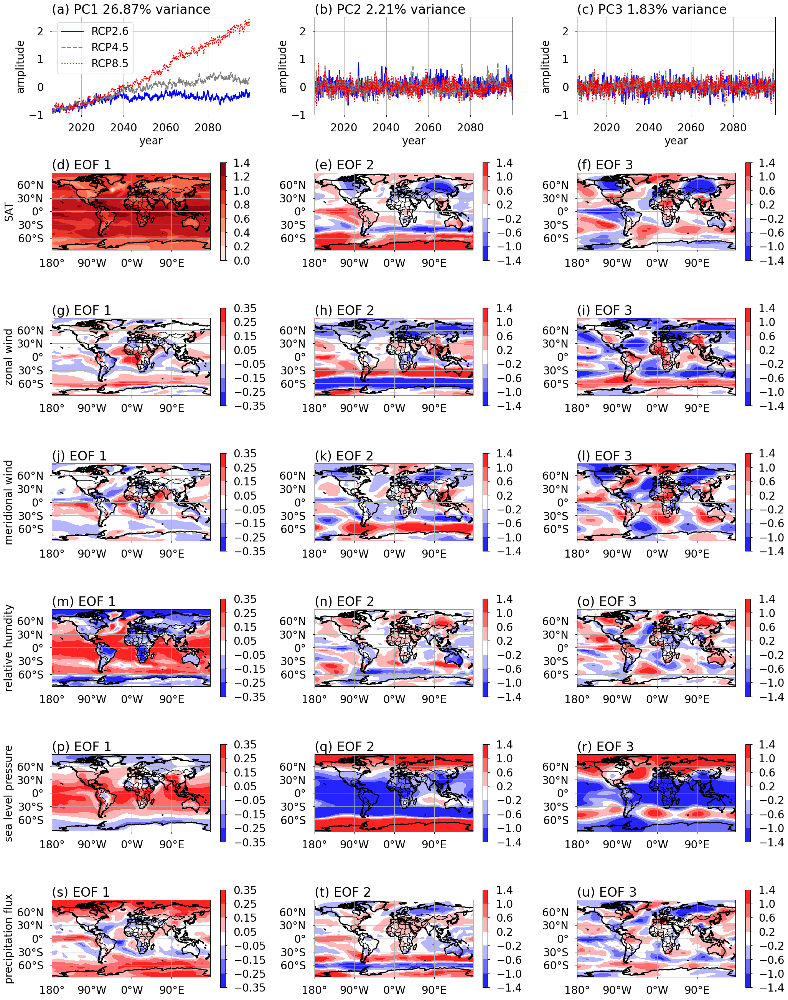

In [31]:
# plot

plt.rcParams['font.size'] = 20

fig=plt.figure()

orientation = 'vertical'
cb_labelsize=20
xticks=[-180,-90,0,90]

eigenvalues = ds_EOF_energy.eigenvalues.values
percentage_variance = eigenvalues/np.sum(eigenvalues)*100

#=============================================================================
# temporal modes

ax=plt.subplot(8,3,1)

plt.plot(ds_EOF_modes.time.values, ds_EOF_modes.eigenvectors.sel(mode=1).sel(exp=2.6).values, 'b-', label='RCP2.6')
plt.plot(ds_EOF_modes.time.values, ds_EOF_modes.eigenvectors.sel(mode=1).sel(exp=4.5).values, '--', color='gray', label='RCP4.5')
plt.plot(ds_EOF_modes.time.values, ds_EOF_modes.eigenvectors.sel(mode=1).sel(exp=8.5).values, 'r:', label='RCP8.5')
plt.xlim(ds_EOF_modes.time.values[0], ds_EOF_modes.time.values[-1])
plt.grid()
plt.title('(a) PC1 {0:.2f}% variance'.format(percentage_variance[0]), loc='left')
plt.xlabel('year')
plt.ylabel('amplitude')
plt.ylim(-1,2.5)
plt.legend()
plt.xticks(ds_EOF_modes.time.values[14*12::12*20]) ; ax.set_xticklabels([2020,2040,2060,2080])

ax=plt.subplot(8,3,2)
plt.plot(ds_EOF_modes.time.values, -ds_EOF_modes.eigenvectors.sel(mode=2).sel(exp=2.6).values, 'b-', label='RCP2.6')
plt.plot(ds_EOF_modes.time.values, -ds_EOF_modes.eigenvectors.sel(mode=2).sel(exp=4.5).values, '--', color='gray', label='RCP4.5')
plt.plot(ds_EOF_modes.time.values, -ds_EOF_modes.eigenvectors.sel(mode=2).sel(exp=8.5).values, 'r:', label='RCP8.5')
plt.xlim(ds_EOF_modes.time.values[0], ds_EOF_modes.time.values[-1])
plt.grid()
plt.title('(b) PC2 {0:.2f}% variance'.format(percentage_variance[1]), loc='left')
plt.xlabel('year')
plt.ylabel('amplitude')
plt.ylim(-1,2.5)
plt.xticks(ds_EOF_modes.time.values[14*12::12*20]) ; ax.set_xticklabels([2020,2040,2060,2080])

ax=plt.subplot(8,3,3)
plt.plot(ds_EOF_modes.time.values, ds_EOF_modes.eigenvectors.sel(mode=3).sel(exp=2.6).values, 'b-', label='RCP2.6')
plt.plot(ds_EOF_modes.time.values, ds_EOF_modes.eigenvectors.sel(mode=3).sel(exp=4.5).values, '--', color='gray', label='RCP4.5')
plt.plot(ds_EOF_modes.time.values, ds_EOF_modes.eigenvectors.sel(mode=3).sel(exp=8.5).values, 'r:', label='RCP8.5')
plt.xlim(ds_EOF_modes.time.values[0], ds_EOF_modes.time.values[-1])
plt.grid()
plt.title('(c) PC3 {0:.2f}% variance'.format(percentage_variance[2]), loc='left')
plt.xlabel('year')
plt.ylabel('amplitude')
plt.ylim(-1,2.5)
plt.xticks(ds_EOF_modes.time.values[14*12::12*20]) ; ax.set_xticklabels([2020,2040,2060,2080])


#=============================================================================
# tas
ax = plt.subplot(8,3,4,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(ds_EOF_modes.tas.sel(mode=1).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.Reds, minC=0, maxC=1.4, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(d) EOF 1', loc='left')
plt.ylabel('SAT')

ax = plt.subplot(8,3,5,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(-ds_EOF_modes.tas.sel(mode=2).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-1.4, maxC=1.4, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(e) EOF 2', loc='left')

ax = plt.subplot(8,3,6,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(ds_EOF_modes.tas.sel(mode=3).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-1.4, maxC=1.4, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(f) EOF 3', loc='left')


#=============================================================================
# uas
ax = plt.subplot(8,3,7,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(ds_EOF_modes.uas.sel(mode=1).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-0.35, maxC=0.35, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(g) EOF 1', loc='left')
plt.ylabel('zonal wind')

ax = plt.subplot(8,3,8,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(-ds_EOF_modes.uas.sel(mode=2).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-1.4, maxC=1.4, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(h) EOF 2', loc='left')

ax = plt.subplot(8,3,9,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(ds_EOF_modes.uas.sel(mode=3).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-1.4, maxC=1.4, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(i) EOF 3', loc='left')


#=============================================================================
# vas
ax = plt.subplot(8,3,10,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(ds_EOF_modes.vas.sel(mode=1).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-0.35, maxC=0.35, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(j) EOF 1', loc='left')
plt.ylabel('meridional wind')

ax = plt.subplot(8,3,11,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(-ds_EOF_modes.vas.sel(mode=2).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-1.4, maxC=1.4, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(k) EOF 2', loc='left')

ax = plt.subplot(8,3,12,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(ds_EOF_modes.vas.sel(mode=3).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-1.4, maxC=1.4, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(l) EOF 3', loc='left')
                           

#=============================================================================
# rhs
ax = plt.subplot(8,3,13,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(ds_EOF_modes.rhs.sel(mode=1).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-0.35, maxC=0.35, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(m) EOF 1', loc='left')
plt.ylabel('relative humdity')

ax = plt.subplot(8,3,14,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(-ds_EOF_modes.rhs.sel(mode=2).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-1.4, maxC=1.4, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(n) EOF 2', loc='left')

ax = plt.subplot(8,3,15,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(ds_EOF_modes.rhs.sel(mode=3).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-1.4, maxC=1.4, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(o) EOF 3', loc='left')

                           
#=============================================================================
# psl
ax = plt.subplot(8,3,16,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(ds_EOF_modes.psl.sel(mode=1).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-0.35, maxC=0.35, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(p) EOF 1', loc='left')
plt.ylabel('sea level pressure')

ax = plt.subplot(8,3,17,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(-ds_EOF_modes.psl.sel(mode=2).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-1.4, maxC=1.4, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(q) EOF 2', loc='left')

ax = plt.subplot(8,3,18,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(ds_EOF_modes.psl.sel(mode=3).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-1.4, maxC=1.4, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(r) EOF 3', loc='left')

                           
#=============================================================================
# pr
ax = plt.subplot(8,3,19,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(ds_EOF_modes.pr.sel(mode=1).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-0.35, maxC=0.35, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(s) EOF 1', loc='left')
plt.ylabel('precipitation flux')

ax = plt.subplot(8,3,20,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(-ds_EOF_modes.pr.sel(mode=2).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-1.4, maxC=1.4, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(t) EOF 2', loc='left')

ax = plt.subplot(8,3,21,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(ds_EOF_modes.pr.sel(mode=3).values.T, lon=ds_EOF_modes.lon.values, lat=ds_EOF_modes.lat.values, cmap=plt.cm.bwr, minC=-1.4, maxC=1.4, num_contours=8)
add_plot_features(fig,h,ax,orientation=orientation, cb_labelsize=cb_labelsize, xticks=xticks)
plt.title('(u) EOF 3', loc='left')

plt.tight_layout()

fig.savefig(images_dir+'/EOF_modes.pdf',bbox_inches='tight',dpi=400)

## Figure 8 - FEMBVVAR timeseries illustration

In [32]:
# Only required for plotting and diagnostics
X_predict_drift = dict() 
for scenario in model.keys():
    X_predict_drift[scenario] = evaluate_model(temporal_params[scenario], this_X[scenario], u=this_u[scenario], local_forecast=False) 

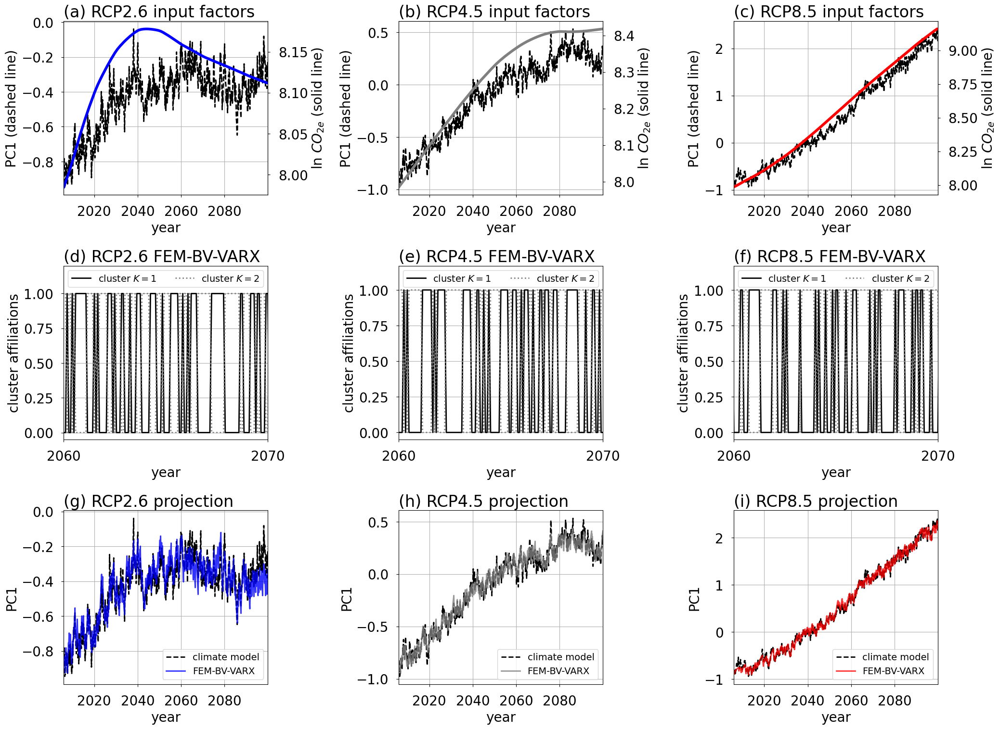

In [33]:
# plot

fig=plt.figure()

plt.rcParams['font.size'] = 20

cmap = dict()
cmap[2.6] = 'b'
cmap[4.5] = 'gray'
cmap[8.5] = 'r'
xticks=np.array(['2020', '2040', '2060', '2080']).astype(np.datetime64)
xticks_zoom=np.array(['2060', '2070']).astype(np.datetime64)

#------------------------------------------------------------
ax1=plt.subplot(6,3,1)
plt.title('(a) RCP2.6 input factors', loc='left')
ax1.plot(ds_model.time.values, X[2.6][:,0], 'k--', label='endogenous PC')
ax1.set_ylabel('PC1 (dashed line)')
ax1.set_xlabel('year')
plt.grid()
ax2 = ax1.twinx()
ax2.plot(ds_model.time.values, u[2.6][:,0], 'b-', lw=4, label='exogenous cummulative emissions')
ax2.set_ylabel('ln $CO_{2e}$ (solid line)')
ax2.tick_params(axis='y')
plt.xlim(ds_model.time.values[0], ds_model.time.values[-1])
plt.xticks(xticks) ; ax1.set_xticklabels(xticks)

#------------------------------------------------------------
ax1=plt.subplot(6,3,2)
plt.title('(b) RCP4.5 input factors', loc='left')
ax1.plot(ds_model.time.values, X[4.5][:,0], 'k--', label='endogenous PC')
ax1.set_ylabel('PC1 (dashed line)')
ax1.set_xlabel('year')
plt.grid()
ax2 = ax1.twinx()
ax2.plot(ds_model.time.values, u[4.5][:,0], '-', color='gray', lw=4, label='exogenous cummulative emissions')
ax2.set_ylabel('ln $CO_{2e}$ (solid line)')
ax2.tick_params(axis='y')
plt.xlim(ds_model.time.values[0], ds_model.time.values[-1])
plt.xticks(xticks) ; ax1.set_xticklabels(xticks)

#------------------------------------------------------------
ax1=plt.subplot(6,3,3)
plt.title('(c) RCP8.5 input factors', loc='left')
ax1.plot(ds_model.time.values, X[8.5][:,0], 'k--', label='endogenous PC')
ax1.set_ylabel('PC1 (dashed line)')
ax1.set_xlabel('year')
plt.grid()
ax2 = ax1.twinx()
ax2.plot(ds_model.time.values, u[8.5][:,0], 'r-', lw=4, label='exogenous cummulative emissions')
ax2.set_ylabel('ln $CO_{2e}$ (solid line)')
ax2.tick_params(axis='y')
plt.xlim(ds_model.time.values[0], ds_model.time.values[-1])
plt.xticks(xticks) ; ax1.set_xticklabels(xticks)

#------------------------------------------------------------
ax=plt.subplot(6,3,4)
plt.title('(d) RCP2.6 FEM-BV-VARX', loc='left')
plt.plot(ds_model.time.values[num_lags:], model[2.6].weights_[:,0], 'k-', label='cluster $K=1$')
plt.plot(ds_model.time.values[num_lags:], model[2.6].weights_[:,1], ':', color='gray', label='cluster $K=2$')
plt.legend(loc='upper center', fontsize=14, ncol=2)
plt.xticks(xticks_zoom) ; ax.set_xticklabels(xticks_zoom)
plt.grid()
plt.xlim(ds_model.time.values[-12*40], ds_model.time.values[-12*30])
plt.ylabel('cluster affiliations')
plt.ylim(-0.05,1.2)
plt.xlabel('year')

#------------------------------------------------------------
ax=plt.subplot(6,3,5)
plt.title('(e) RCP4.5 FEM-BV-VARX', loc='left')
plt.plot(ds_model.time.values[num_lags:], model[4.5].weights_[:,0], 'k-', label='cluster $K=1$')
plt.plot(ds_model.time.values[num_lags:], model[4.5].weights_[:,1], ':', color='gray', label='cluster $K=2$')
plt.legend(loc='upper center', fontsize=14, ncol=2)
plt.xticks(xticks_zoom) ; ax.set_xticklabels(xticks_zoom)
plt.grid()
plt.xlim(ds_model.time.values[-12*40], ds_model.time.values[-12*30])
plt.ylabel('cluster affiliations')
plt.ylim(-0.05,1.17)
plt.xlabel('year')

#------------------------------------------------------------
ax=plt.subplot(6,3,6)
plt.title('(f) RCP8.5 FEM-BV-VARX', loc='left')
plt.plot(ds_model.time.values[num_lags:], model[8.5].weights_[:,0], 'k-', label='cluster $K=1$')
plt.plot(ds_model.time.values[num_lags:], model[8.5].weights_[:,1], ':', color='gray', label='cluster $K=2$')
plt.legend(loc='upper center', fontsize=14, ncol=2)
plt.xticks(xticks_zoom) ; ax.set_xticklabels(xticks_zoom)
plt.grid()
plt.xlim(ds_model.time.values[-12*40], ds_model.time.values[-12*30])
plt.ylabel('cluster affiliations')
plt.ylim(-0.05,1.17)
plt.xlabel('year')

#------------------------------------------------------------
ax=plt.subplot(6,3,7)
plt.title('(g) RCP2.6 projection', loc='left')
plt.plot(ds_model.time.values, X[2.6][:,0], 'k--', label='climate model')
plt.plot(ds_model.time.values, X_predict_drift[2.6][:,0], '-', color=cmap[2.6], label='FEM-BV-VARX', alpha=0.8)
plt.legend(loc='lower right', fontsize=14)
plt.xticks(xticks) ; ax.set_xticklabels(xticks)
plt.grid()
plt.xlim(ds_model.time.values[0], ds_model.time.values[-1])
plt.ylabel('PC1')
plt.xlabel('year')

#------------------------------------------------------------
ax=plt.subplot(6,3,8)
plt.title('(h) RCP4.5 projection', loc='left')
plt.plot(ds_model.time.values, X[4.5][:,0], 'k--', label='climate model')
plt.plot(ds_model.time.values, X_predict_drift[4.5][:,0], '-', color=cmap[4.5], label='FEM-BV-VARX', alpha=0.8)
plt.legend(loc='lower right', fontsize=14)
plt.xticks(xticks) ; ax.set_xticklabels(xticks)
plt.grid()
plt.xlim(ds_model.time.values[0], ds_model.time.values[-1])
plt.ylabel('PC1')
plt.xlabel('year')

#------------------------------------------------------------
ax=plt.subplot(6,3,9)
plt.title('(i) RCP8.5 projection', loc='left')
plt.plot(ds_model.time.values, X[8.5][:,0], 'k--', label='climate model')
plt.plot(ds_model.time.values, X_predict_drift[8.5][:,0], '-', color=cmap[8.5], label='FEM-BV-VARX', alpha=0.8)
plt.legend(loc='lower right', fontsize=14)
plt.xticks(xticks) ; ax.set_xticklabels(xticks)
plt.grid()
plt.xlim(ds_model.time.values[0], ds_model.time.values[-1])
plt.ylabel('PC1')
plt.xlabel('year')

plt.tight_layout()

fig.savefig(images_dir+'/FEMBVVARX_projections.pdf',bbox_inches='tight',dpi=400)

## Figure 9 - reconstruction timeseries process illustration

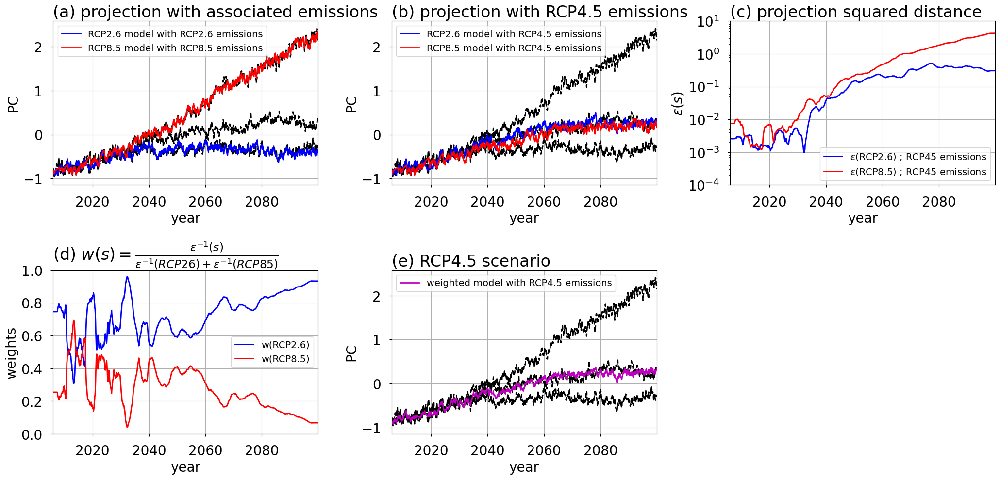

In [34]:
# plot

plt.rcParams['font.size'] = 20

fig=plt.figure()

cmap = dict()
cmap[2.6] = 'b'
cmap[4.5] = 'g'
cmap[8.5] = 'r'
xticks=np.array(['2020', '2040', '2060', '2080']).astype(np.datetime64)
scenarios = ds_model.scenario.values

#------------------------------------------------------------
ax=plt.subplot(6,3,1)
plt.title('(a) projection with associated emissions', loc='left')
for scenario in scenarios:
    plt.plot(ds_model.time.values, X[scenario][:,0], 'k--')
for scenario in wt.keys():
    plt.plot(ds_model.time.values, X_predict_drift[scenario][:,0], color=cmap[scenario], label='RCP{0} model with RCP{0} emissions'.format(scenario))
plt.legend(fontsize=14)
plt.xticks(xticks) ; ax.set_xticklabels(xticks)
plt.grid()
plt.xlim(ds_model.time.values[0], ds_model.time.values[-1])
plt.ylabel('PC')
plt.xlabel('year')

#------------------------------------------------------------
ax=plt.subplot(6,3,2)
plt.title('(b) projection with RCP4.5 emissions', loc='left')
for scenario in scenarios:
    plt.plot(ds_model.time.values, X[scenario][:,0], 'k--')
for scenario in wt.keys():
    plt.plot(ds_model.time.values, X_predict_drift_newExog[scenario][:,0], '-', color=cmap[scenario], label='RCP{0} model with RCP4.5 emissions'.format(scenario))
plt.grid(); 
plt.legend(fontsize=14)
plt.xlim(ds_model.time.values[0], ds_model.time.values[-1])
plt.ylabel('PC')
plt.xticks(xticks) ; ax.set_xticklabels(xticks)
plt.xlabel('year')

#------------------------------------------------------------
ax=plt.subplot(6,3,3)
plt.title('(c) projection squared distance', loc='left')
for scenario in wt.keys():
    plt.plot(ds_model.time.values, X_sqerror_drift_newExog[scenario][:,0], '-', color=cmap[scenario], label='$\\epsilon$'+'(RCP{0}) ; RCP45 emissions'.format(scenario))
plt.grid(); 
plt.legend(fontsize=14, loc='lower right')
plt.yscale('log')
plt.xlim(ds_model.time.values[0], ds_model.time.values[-1])
plt.ylabel('$\\epsilon(s)$')
plt.xticks(xticks) ; ax.set_xticklabels(xticks)
plt.ylim(1e-4,1e1)
plt.xlabel('year')

#------------------------------------------------------------
ax=plt.subplot(6,3,4)
plt.title('(d) $w(s) = \\frac{ \\epsilon^{-1}(s) }{ \\epsilon^{-1}(RCP26) + \\epsilon^{-1}(RCP85) }$', loc='left')
for scenario in wt.keys():
    plt.plot(ds_model.time.values, wt[scenario], color=cmap[scenario], label='w(RCP{0})'.format(scenario))
plt.grid(); 
plt.legend(loc='center right', fontsize=14)
plt.xlim(ds_model.time.values[0], ds_model.time.values[-1])
plt.ylim(0,1)
plt.ylabel('weights')
plt.xticks(xticks) ; ax.set_xticklabels(xticks)
plt.xlabel('year')

#------------------------------------------------------------
ax=plt.subplot(6,3,5)
plt.title('(e) RCP4.5 scenario', loc='left')
for scenario in scenarios:
    plt.plot(ds_model.time.values, X[scenario][:,0], 'k--')
plt.plot(ds_model.time.values, X_predict_drift_newExog_combined[:,0], 'm-', label='weighted model with RCP4.5 emissions')
plt.grid(); plt.legend(fontsize=14)
plt.xlim(ds_model.time.values[0], ds_model.time.values[-1])
plt.ylabel('PC')
plt.xticks(xticks) ; ax.set_xticklabels(xticks)
plt.xlabel('year')


plt.tight_layout()

fig.savefig(images_dir+'/FEMBVVARX_method_RCP{0}.pdf'.format(int(new_exog*10)),bbox_inches='tight',dpi=400)

## Figure 10 - single model multi-variable mean validation

In [35]:
# Calculate wet bulb globe temperature on reconstructed fields
ds_final['T_wbgt_post']        = copy.deepcopy(ds_final.psl)
ds_final['T_wbgt_post'].values = calculate_WBGT(ds_final.psl.values/100, ds_final.tas.values+273, ds_final.rhs.values.reshape(np.shape(ds_final.tas.values)))[0] # Note, convert psl from Pa to mbar

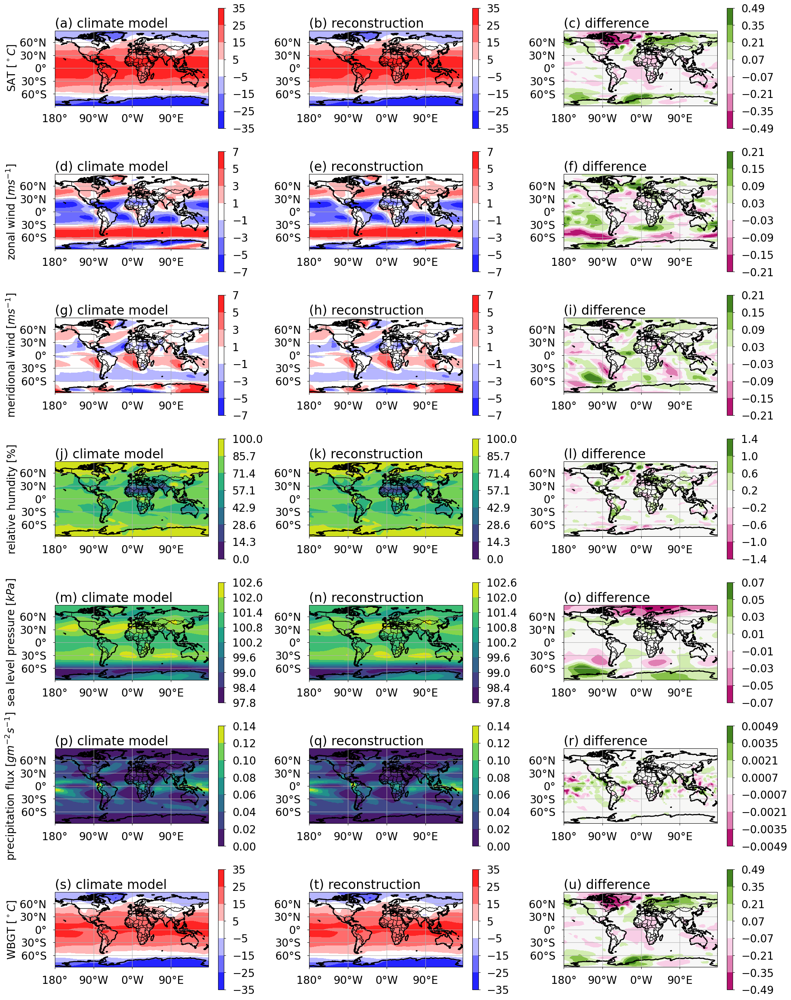

In [36]:
# plot

plt.rcParams['font.size'] = 20

minC_avg=dict() ;               maxC_avg=dict() ;              minC=dict() ;               maxC=dict() ;              scaleby=dict() ; title=dict()
minC_avg['tas'] = -35 ;         maxC_avg['tas'] = 35 ;         minC['tas'] = -0.49 ;       maxC['tas'] = 0.49 ;       scaleby['tas'] = 1.0 ;         title['tas'] = 'SAT [$^\circ C$]'
minC_avg['T_wbgt_post'] = -35 ; maxC_avg['T_wbgt_post'] = 35 ; minC['T_wbgt_post']=-0.49 ; maxC['T_wbgt_post']=0.49 ; scaleby['T_wbgt_post'] = 1.0 ; title['T_wbgt_post'] = 'WBGT [$^\circ C$]'
minC_avg['uas'] = -7 ;          maxC_avg['uas'] = 7 ;          minC['uas'] = -0.21 ;       maxC['uas'] = 0.21 ;       scaleby['uas'] = 1.0 ;         title['uas'] = 'zonal wind [$m s^{-1}$]'
minC_avg['vas'] = -7 ;          maxC_avg['vas'] = 7 ;          minC['vas'] = -0.21 ;       maxC['vas'] = 0.21 ;       scaleby['vas'] = 1.0 ;         title['vas'] = 'meridional wind [$m s^{-1}$]'
minC_avg['pr'] = 0 ;            maxC_avg['pr'] = 0.14 ;        minC['pr'] = -0.0049 ;      maxC['pr'] = 0.0049 ;      scaleby['pr'] = 1.0e3 ;        title['pr'] = 'precipitation flux [$g m^{-2} s^{-1}$]'
minC_avg['rhs'] = 0 ;           maxC_avg['rhs'] = 100 ;        minC['rhs'] = -1.4 ;        maxC['rhs'] = 1.4 ;        scaleby['rhs'] = 1.0 ;         title['rhs'] = 'relative humdity [%]'
minC_avg['psl'] = None ;        maxC_avg['psl'] = None ;       minC['psl'] = -0.07 ;       maxC['psl'] = 0.07 ;       scaleby['psl'] = 1.0e-3 ;      title['psl'] = 'sea level pressure [$kPa$]'

num_contours=8
cb_labelsize=20
orientation = 'vertical' ; tick_rotation=0

fig=plt.figure()

var_name_list = ['tas', 'uas', 'vas', 'rhs', 'psl', 'pr', 'T_wbgt_post']

for vv,var_name in enumerate(var_name_list):
    
    if var_name in ['tas', 'uas', 'vas', 'T_wbgt_post']:
        cmap=plt.cm.bwr
        this_num_contours = num_contours
    else:
        cmap=plt.cm.viridis
        this_num_contours = 8

    ax = plt.subplot(8,3,1+vv*3,projection=ccrs.PlateCarree(central_longitude=0))
    data_ref = scaleby[var_name]*ds_model.sel(scenario=4.5)[var_name].mean('time').T
    h = plot_field(data_ref, lon=ds_model.lon.values, lat=ds_model.lat.values, minC=minC_avg[var_name], maxC=maxC_avg[var_name], num_contours=this_num_contours, cmap=cmap)
    add_plot_features(fig,h,ax, orientation=orientation, tick_rotation=tick_rotation, cb_labelsize=cb_labelsize, xticks=[-180,-90,0,90])
    plt.title('({0}) climate model'.format(chr(96+1+vv*3)), loc='left')
    plt.ylabel(title[var_name])
    
    ax = plt.subplot(8,3,2+vv*3,projection=ccrs.PlateCarree(central_longitude=0))
    data_final = scaleby[var_name]*ds_final[var_name].mean('time').T
    h = plot_field(data_final, lon=ds_model.lon.values, lat=ds_model.lat.values, minC=minC_avg[var_name], maxC=maxC_avg[var_name], num_contours=this_num_contours, cmap=cmap)
    add_plot_features(fig,h,ax, orientation=orientation, tick_rotation=tick_rotation, cb_labelsize=cb_labelsize, xticks=[-180,-90,0,90])
    plt.title('({0}) reconstruction'.format(chr(96+2+vv*3)), loc='left')

    ax = plt.subplot(8,3,3+vv*3,projection=ccrs.PlateCarree(central_longitude=tick_rotation))
    h = plot_field(data_final - data_ref, lon=ds_model.lon.values, lat=ds_model.lat.values, minC=minC[var_name], maxC=maxC[var_name], cmap=plt.cm.PiYG, num_contours=num_contours)
    add_plot_features(fig,h,ax, orientation=orientation, tick_rotation=tick_rotation, cb_labelsize=cb_labelsize, xticks=[-180,-90,0,90])
    plt.title('({0}) difference'.format(chr(96+3+vv*3)), loc='left')
    del data_final, data_ref

plt.tight_layout()

fig.savefig(images_dir+'/FEMBVVARX-reconstruction_error_multiple_variables.pdf',bbox_inches='tight',dpi=400)

## Supplementary Figure 6 - single model timeseries validation

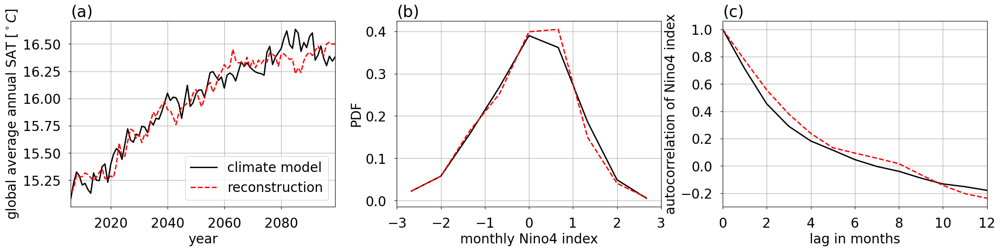

In [37]:
# time series plot comparisons

# Global average
ds_model['lat_wt'] = np.cos(ds_model.lat/180*np.pi)
ds_model['lat_wt'] = ds_model['lat_wt'] / ds_model['lat_wt'].mean()
ds_final['lat_wt'] = np.cos(ds_final.lat/180*np.pi)
ds_final['lat_wt'] = ds_final['lat_wt'] / ds_final['lat_wt'].mean()
ds_model_annual = ds_model.groupby('time.year').mean('time')
ds_final_annual = ds_final.groupby('time.year').mean('time')

# ENSO
da_tmp_model = ds_model_anom.sel(scenario=new_exog).tas.sel(lat=slice(-5,5)).sel(lon=slice(160,210)).mean('lon').mean('lat')
da_tmp_model = da_tmp_model - da_tmp_model.rolling(time=60, center=True).mean()
da_tmp_model = (da_tmp_model.groupby('time.month')/da_tmp_model.groupby('time.month').std('time')).values

ds_final_anom = ds_final.groupby('time.month') - ds_final.groupby('time.month').mean('time')
da_tmp_final = ds_final_anom.tas.sel(lat=slice(-5,5)).sel(lon=slice(160,210)).mean('lon').mean('lat')
da_tmp_final = da_tmp_final - da_tmp_final.rolling(time=60, center=True).mean()
da_tmp_final = (da_tmp_final.groupby('time.month')/da_tmp_final.groupby('time.month').std('time')).values

plt.rcParams['font.size'] = 20

fig=plt.figure()

plt.subplot(6,3,1)
plt.title('(a)', loc='left')
plt.xlabel('year')
plt.plot(ds_model_annual.year, (ds_model_annual.sel(scenario=new_exog).tas.mean('lon')*ds_model_annual.lat_wt).mean('lat'), 'k-', label='climate model')
plt.plot(ds_final_annual.year, (ds_final_annual.tas.mean('lon')*ds_final_annual.lat_wt).mean('lat'), 'r--', label='reconstruction')
plt.xlim(ds_final_annual.year[0], ds_final_annual.year[-1])
plt.legend(loc='lower right')
plt.grid()
plt.ylabel('global average annual SAT [$^\circ C$]')

plt.subplot(6,3,2)
num_bins=10
bin_edges=np.linspace(-3,3,num_bins)
bins=(bin_edges[1:]+bin_edges[:-1])/2.0
model_enso_pdf, bin_edges = np.histogram(da_tmp_model, bin_edges, density=True)
final_enso_pdf, bin_edges = np.histogram(da_tmp_final, bin_edges, density=True)
plt.plot(bins,model_enso_pdf,'k-', label='climate model')
plt.plot(bins,final_enso_pdf,'r--', label='reconstruction')
plt.grid()
plt.xlim(bin_edges[0], bin_edges[-1])
plt.xlabel('monthly Nino4 index')
plt.title('(b)', loc='left')
plt.ylabel('PDF')

plt.subplot(6,3,3)
num_corr = 13
lags = np.linspace(0,num_corr-1, num_corr)
num_samples = len(da_tmp_model)
model_enso_corr = np.zeros((num_corr), dtype=float)
final_enso_corr = np.zeros((num_corr), dtype=float)
for ii in range(0,num_corr):
    model_enso_corr[ii] = nancorr(da_tmp_model[ii:ii+num_samples-num_corr],da_tmp_model[:num_samples-num_corr])
    final_enso_corr[ii] = nancorr(da_tmp_final[ii:ii+num_samples-num_corr],da_tmp_final[:num_samples-num_corr])
plt.plot(lags,model_enso_corr,'k-', label='climate model')
plt.plot(lags,final_enso_corr,'r--', label='reconstruction')
plt.grid()
plt.xlim(lags[0], lags[-1])
plt.xlabel('lag in months')
plt.title('(c)', loc='left')
plt.ylabel('autocorrelation of Nino4 index')

plt.tight_layout()

fig.savefig(images_dir+'/FEMBVVARX-combined_reconstruction_global_avg_enso_RCP{0}.pdf'.format(int(new_exog*10)),bbox_inches='tight',dpi=400)

## Supplementary Figure 7 - single model surface air temperature higher order stats map validation

In [38]:
da_model = ds_model.tas.sel(scenario=new_exog)
da_final = ds_final.tas

da_model_rolling = da_model.rolling(time=60, center=True).mean().ffill(dim='time').bfill(dim='time')
da_model_detrend = da_model - da_model_rolling
da_model_detrend = da_model_detrend.groupby('time.month') - da_model_detrend.groupby('time.month').mean('time')

da_final_rolling = da_final.rolling(time=60, center=True).mean().ffill(dim='time').bfill(dim='time')
da_final_detrend = da_final - da_final_rolling
da_final_detrend = da_final_detrend.groupby('time.month') - da_final_detrend.groupby('time.month').mean('time')

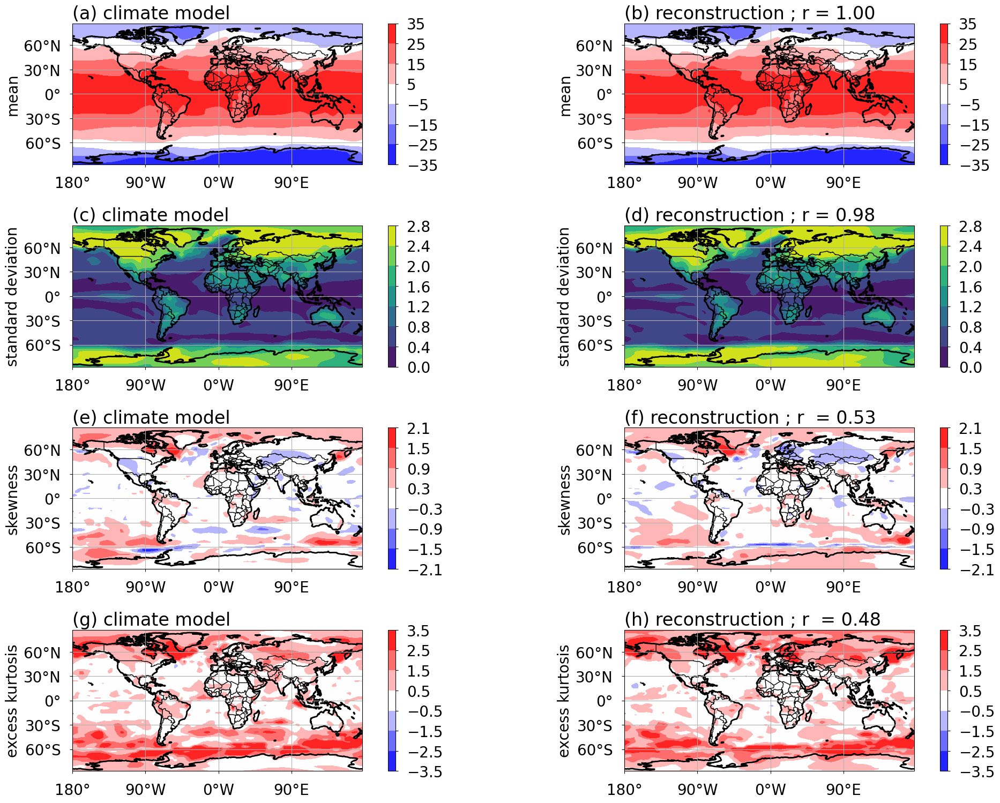

In [39]:
# plot FEMBVVARX reconstruction error of gridded fields

plt.rcParams['font.size'] = 20

fig=plt.figure()

minC_avg = -35; maxC_avg = 35
minC_std = 0; maxC_std = 2.8
minC_skew = -2.1; maxC_skew = 2.1
minC_kurt = -3.5; maxC_kurt = 3.5
num_contours=8

var_name='tas'

start_year=2070

# Climate model output
this_da_model = da_model.sel(time=slice('{0}-01-01'.format(start_year),'{0}-12-01'.format(start_year+29)))
this_da_model_detrend = da_model_detrend.sel(time=slice('{0}-01-01'.format(start_year),'{0}-12-01'.format(start_year+29)))
model_avg      = this_da_model.mean('time')
model_std      = this_da_model_detrend.std('time')
model_Z        = (this_da_model_detrend - this_da_model_detrend.mean('time'))/model_std
model_skewness = (model_Z**3.0).mean('time')
model_kurtosis = (model_Z**4.0).mean('time')-3
del model_Z, this_da_model, this_da_model_detrend

ax = plt.subplot(8,2,1,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(model_avg.values.T, lon=ds_model.lon.values, lat=ds_model.lat.values, minC=minC_avg, maxC=maxC_avg, cmap=plt.cm.bwr, num_contours=num_contours)
add_plot_features(fig,h,ax, orientation='vertical', xticks=[-180,-90,0,90])
plt.title('(a) climate model', loc='left')
plt.ylabel('mean')

ax = plt.subplot(8,2,3,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(model_std.values.T, lon=ds_model.lon.values, lat=ds_model.lat.values, minC=minC_std, maxC=maxC_std, cmap=plt.cm.viridis, num_contours=num_contours)
add_plot_features(fig,h,ax, orientation='vertical', xticks=[-180,-90,0,90])
plt.title('(c) climate model', loc='left')
plt.ylabel('standard deviation')

ax = plt.subplot(8,2,5,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(model_skewness.values.T, lon=ds_model.lon.values, lat=ds_model.lat.values, minC=minC_skew, maxC=maxC_skew, cmap=plt.cm.bwr, num_contours=num_contours)
add_plot_features(fig,h,ax, orientation='vertical', xticks=[-180,-90,0,90])
plt.title('(e) climate model', loc='left')
plt.ylabel('skewness')

ax = plt.subplot(8,2,7,projection=ccrs.PlateCarree(central_longitude=0))
h = plot_field(model_kurtosis.values.T, lon=ds_model.lon.values, lat=ds_model.lat.values, minC=minC_kurt, maxC=maxC_kurt, cmap=plt.cm.bwr, num_contours=num_contours)
add_plot_features(fig,h,ax, orientation='vertical', xticks=[-180,-90,0,90])
plt.title('(g) climate model', loc='left')
plt.ylabel('excess kurtosis')


# FEMBVVARX model output
this_da_final = da_final.sel(time=slice('{0}-01-01'.format(start_year),'{0}-12-01'.format(start_year+29)))
this_da_final_detrend = da_final_detrend.sel(time=slice('{0}-01-01'.format(start_year),'{0}-12-01'.format(start_year+29)))
final_avg      = this_da_final.mean('time')
final_std      = this_da_final_detrend.std('time')
final_Z        = (this_da_final_detrend - this_da_final_detrend.mean('time'))/final_std
final_skewness = (final_Z**3.0).mean('time')
final_kurtosis = (final_Z**4.0).mean('time')-3
del final_Z, this_da_final, this_da_final_detrend

ax = plt.subplot(8,2,2,projection=ccrs.PlateCarree(central_longitude=0))
plt.title('(b) reconstruction ; r = {0:.2f}'.format(nancorr((model_avg.values.T*np.sqrt(ds_model['lat_wt'].values)).flatten(), (final_avg.values.T*np.sqrt(ds_model['lat_wt'].values)).flatten())), loc='left')
h = plot_field(final_avg.values.T, lon=ds_model.lon.values, lat=ds_model.lat.values, minC=minC_avg, maxC=maxC_avg, cmap=plt.cm.bwr, num_contours=num_contours)
add_plot_features(fig,h,ax, orientation='vertical', xticks=[-180,-90,0,90])
plt.ylabel('mean')

ax = plt.subplot(8,2,4,projection=ccrs.PlateCarree(central_longitude=0))
plt.title('(d) reconstruction ; r = {0:.2f}'.format(nancorr((model_std.values.T*np.sqrt(ds_model['lat_wt'].values)).flatten(), (final_std.values.T*np.sqrt(ds_model['lat_wt'].values)).flatten())), loc='left')
h = plot_field(final_std.values.T, lon=ds_model.lon.values, lat=ds_model.lat.values, minC=minC_std, maxC=maxC_std, cmap=plt.cm.viridis, num_contours=num_contours)
add_plot_features(fig,h,ax, orientation='vertical', xticks=[-180,-90,0,90])
plt.ylabel('standard deviation')

ax = plt.subplot(8,2,6,projection=ccrs.PlateCarree(central_longitude=0))
plt.title('(f) reconstruction ; r  = {0:.2f}'.format(nancorr((model_skewness.values.T*np.sqrt(ds_model['lat_wt'].values)).flatten(), (final_skewness.values.T*np.sqrt(ds_model['lat_wt'].values)).flatten())), loc='left')
h = plot_field(final_skewness.values.T, lon=ds_model.lon.values, lat=ds_model.lat.values, minC=minC_skew, maxC=maxC_skew, cmap=plt.cm.bwr, num_contours=num_contours)
add_plot_features(fig,h,ax, orientation='vertical', xticks=[-180,-90,0,90])
plt.ylabel('skewness')

ax = plt.subplot(8,2,8,projection=ccrs.PlateCarree(central_longitude=0))
plt.title('(h) reconstruction ; r  = {0:.2f}'.format(nancorr((model_kurtosis.values.T*np.sqrt(ds_model['lat_wt'].values)).flatten(), (final_kurtosis.values.T*np.sqrt(ds_model['lat_wt'].values)).flatten())), loc='left')
h = plot_field(final_kurtosis.values.T, lon=ds_model.lon.values, lat=ds_model.lat.values, minC=minC_kurt, maxC=maxC_kurt, cmap=plt.cm.bwr, num_contours=num_contours)
add_plot_features(fig,h,ax, orientation='vertical', xticks=[-180,-90,0,90])
plt.ylabel('excess kurtosis')

plt.tight_layout()

fig.savefig(images_dir+'/FEMBVVARX-combined_reconstruction_moments_gridded.pdf',bbox_inches='tight',dpi=400)

# QuickClim Validation and Parameter Sensivity for all models and all scenarios

## Supplementary figure 8 - multi-model validation

In [40]:
ds_multi_model_validation = xr.open_dataset(results_dir+"/ds_multi_model_validation.nc")

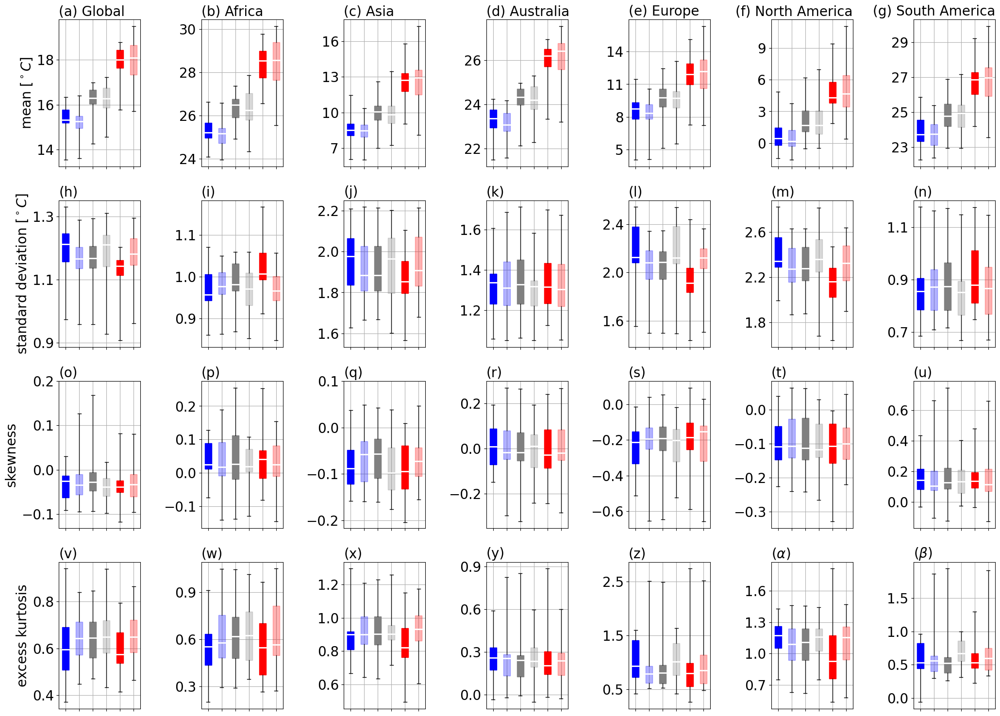

In [41]:
# plot 

fontsize=20
plt.rcParams['font.size'] = fontsize
plt.rcParams['ytick.major.pad'] = 4

climate_variable='tas'

stat_list=['mean', 'std_region_avg_post', 'skewness_region_avg_post', 'kurtosis_region_avg_post']

start_year=2070

label=list()
for scenario in ds_multi_model_validation.scenario.values:
    label.append('climate model RCP'+str(int(10*scenario)))
    label.append('FEMBVVARX RCP'+str(int(10*scenario)))
    
region_plot_list = ['Global', 'Africa', 'Asia', 'Australia', 'Europe', 'North America', 'South America'] 

long_var_name = dict()
long_var_name['tas'] = 'air temperature [$^\circ C$]'

long_stat_name=dict()
long_stat_name['mean'] = 'mean [$^\circ C$]'
long_stat_name['std_region_avg_post'] = 'standard deviation [$^\circ C$]'
long_stat_name['skewness_region_avg_post'] = 'skewness'
long_stat_name['kurtosis_region_avg_post'] = 'excess kurtosis'

greek_letters = ['$\\alpha$', '$\\beta$', '$\\gamma$', '$\\delta$', '$\\epsilon$', '$\\zeta$']

fig=plt.figure()

for jj,stat in enumerate(stat_list):
    
    ds_tmp0 = ds_multi_model_validation.region_stats.isel(num_clusters=0).isel(num_lags=0).isel(num_lags_exog=0).isel(state_length=0).sel(statistics=stat).sel(start_year=start_year).sel(climate_variable=climate_variable).isel(error_window=0)
    if stat in ['kurtosis', 'kurtosis_region_avg_post']:
        ds_tmp0 = ds_tmp0 - 3

    for ii,region in enumerate(region_plot_list):
        ds_tmp = ds_tmp0.sel(region=region)

        pos = ii+1+jj*len(region_plot_list)
        ax=plt.subplot(8,7,pos)
        if jj==0:
            if region == 'North America':
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='right', fontsize=fontsize)
            elif region == 'South America':
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='right', fontsize=fontsize)
            elif region == 'Antarctica':
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='right', fontsize=fontsize)
            else:
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='left', fontsize=fontsize)
        else:
            if pos<=26:
                plt.title('({0})'.format(chr(96+pos)), loc='left', fontsize=fontsize)
            else:
                plt.title('({0})'.format(greek_letters[pos-27]), loc='left', fontsize=fontsize)

        for kk,scenario in enumerate(ds_tmp.scenario.values):
            if stat=='mean':
                filt = ~np.isnan(ds_tmp.sel(scenario=scenario).sel(data_source='FEMBVVARX').values)
                this_data = np.vstack((ds_tmp.sel(scenario=scenario).sel(data_source='climate_model').values[filt], \
                                       ds_tmp.sel(scenario=scenario).sel(data_source='FEMBVVARX').values[filt]))
            else:
                if True:
                    filt = ~np.isnan(ds_tmp.sel(scenario=scenario).sel(data_source='FEMBVVARX_detrended_anom').values)
                    this_data = np.vstack((ds_tmp.sel(scenario=scenario).sel(data_source='climate_model_detrended_anom').values[filt], \
                                           ds_tmp.sel(scenario=scenario).sel(data_source='FEMBVVARX_detrended_anom').values[filt]))
                else:
                    filt = ~np.isnan(ds_tmp.sel(scenario=scenario).sel(data_source='FEMBVVARX').values)
                    this_data = np.vstack((ds_tmp.sel(scenario=scenario).sel(data_source='climate_model').values[filt], \
                                           ds_tmp.sel(scenario=scenario).sel(data_source='FEMBVVARX').values[filt]))
                    
                    this_data -= np.vstack((ds_tmp.sel(scenario=scenario).sel(data_source='climate_model_detrended').values[filt], \
                                           ds_tmp.sel(scenario=scenario).sel(data_source='FEMBVVARX_detrended').values[filt]))
                    
                    this_data += np.vstack((ds_tmp.sel(scenario=scenario).sel(data_source='climate_model_detrended_anom').values[filt], \
                                           ds_tmp.sel(scenario=scenario).sel(data_source='FEMBVVARX_detrended_anom').values[filt]))

            if kk==0:
                data = this_data
            else:
                data = np.vstack((data, this_data))
            del this_data

        if ii==0:
            plt.ylabel('{0}'.format(long_stat_name[stat]), fontsize=fontsize)
            
        bplot = plt.boxplot(data.T, notch=False, patch_artist=True, whis=10, medianprops={"linewidth": 2, "color": 'w'})
                    
        colors = ['b', 'b', 'gray', 'gray', 'r', 'r']
        for patch, color in zip(bplot['boxes'], colors):
            patch.set_color(color)
            
        alphas = [1, 0.3, 1, 0.3, 1, 0.3]
        for patch, alpha in zip(bplot['boxes'], alphas):
            patch.set_alpha(alpha)
            
        if jj==len(stat_list)-1:
            ax.set_xticklabels([])
        else:
            ax.set_xticklabels([])

        if stat== 'mean':
            if region == 'Asia':
                ax.set_yticks([7,10,13,16])
            elif region == 'Europe':
                ax.set_yticks([5,8,11,14])
            elif region == 'North America':
                ax.set_yticks([0,3,6,9])
            elif region == 'South America':
                ax.set_yticks([23,25,27,29])
            elif region == 'Antarctica':
                ax.set_yticks([-36,-32,-28])

        elif stat== 'std_region_avg_post':
            if region == 'Europe':
                ax.set_yticks([1.6,2.0,2.4])
            elif region == 'North America':
                ax.set_yticks([1.8,2.2,2.6])
            elif region == 'South America':
                ax.set_yticks([0.7,0.9,1.1])
            elif region == 'Antarctica':
                ax.set_yticks([1.8,2.2,2.6])
            elif region == 'Global':
                ax.set_yticks([0.9,1.1,1.3])
                
        elif stat== 'skewness_region_avg_post':
            if region == 'Asia':
                ax.set_yticks([-0.2,-0.1,0,0.1])
            elif region == 'Global':
                ax.set_yticks([-0.1,0,0.1,0.2])

        elif stat=='kurtosis_region_avg_post':
            if region == 'North America':
                ax.set_yticks([0.7,1.0,1.3,1.6])
            elif region == 'Antarctica':
                ax.set_yticks([0.2,0.6,1.0])
            elif region == 'South America':
                ax.set_yticks([0.0,0.5,1.0,1.5])
            elif region == 'Australia':
                ax.set_yticks([0.0,0.3,0.6,0.9])
            elif region == 'Africa':
                ax.set_yticks([0.3,0.6,0.9])
            elif region == 'Europe':
                ax.set_yticks([0.5,1.5,2.5])

        plt.grid()
        del ds_tmp, data
    del ds_tmp0    
del label

plt.tight_layout()
fig.savefig(images_dir+'/FEMBVVARX_reconstruction_stats.pdf',bbox_inches='tight',dpi=400)

In [42]:
del ds_multi_model_validation

## Supplementary figure 9 - hyperparameter sweep

In [20]:
ds_hyper_parameter_sweep = xr.open_dataset(results_dir+"/ds_hyper_parameter_sweep.nc")

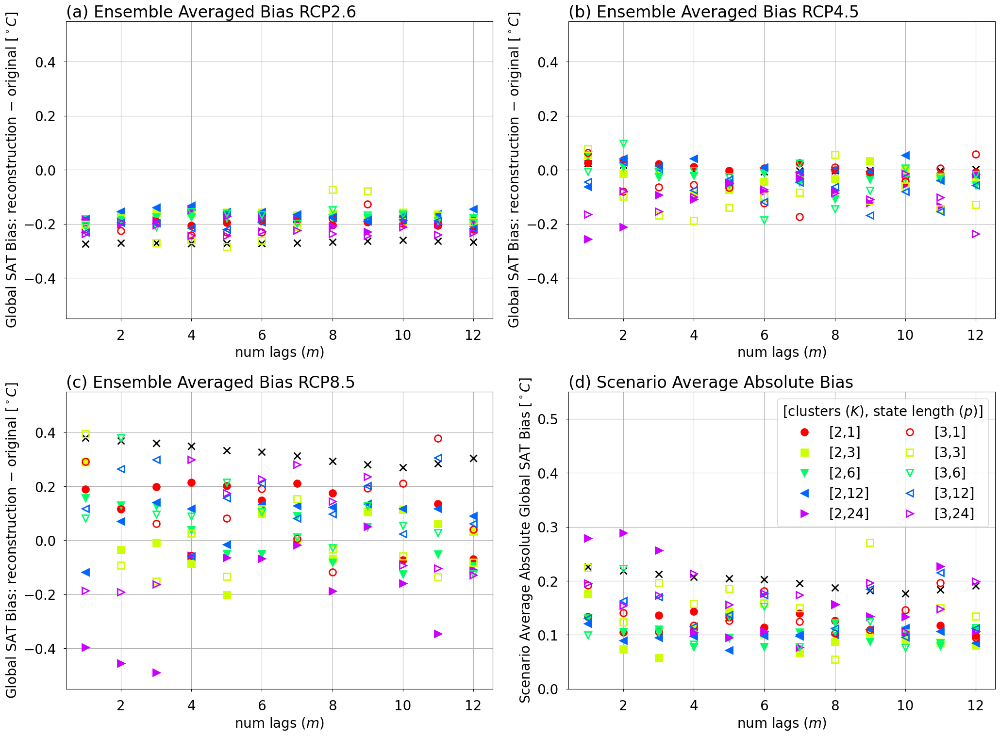

In [22]:
# plot 

plt.rcParams['font.size'] = 20

ymin=dict() ; ymax=dict()
ymin['mean']=-0.55 ; ymax['mean']=0.55
ymin['std']=None ; ymax['std']=None
ymin['skewness']=None ; ymax['skewness']=None
ymin['kurtosis']=None ; ymax['kurtosis']=None
ymin['std_region_avg_post']=None ; ymax['std_region_avg_post']=None
ymin['skewness_region_avg_post']=None ; ymax['skewness_region_avg_post']=None
ymin['kurtosis_region_avg_post']=None ; ymax['kurtosis_region_avg_post']=None

cmap = generate_colours_dict(ds_hyper_parameter_sweep.state_length.values)
region='Global'

linewidth=0
all_lines = ['-', '-', '-', '-']
lines=dict()
for kk,cc in enumerate(ds_hyper_parameter_sweep.num_clusters.values):
    lines[cc] = all_lines[kk]

markersize=10
all_markers = ['o', 's', 'v', '<', '>', '+']
markers=dict()
if False:
    for kk,cc in enumerate(ds_hyper_parameter_sweep.num_clusters.values):
        markers[cc] = all_markers[kk]
else:
    for kk,ss in enumerate(ds_hyper_parameter_sweep.state_length.values):
        markers[ss] = all_markers[kk]
    
region='Global'
climate_variable='tas'
stat_name='mean'

xticks = [2,4,6,8,10,12]
    
fig=plt.figure()
for kk,scenario in enumerate(ds_hyper_parameter_sweep.scenario.values):
    ax=plt.subplot(4,2,1+kk)
    plt.title('({1}) Ensemble Averaged Bias RCP{0}'.format(scenario, chr(97+kk)), loc='left')
    if kk==0:
        plt.ylabel(stat_name)
    plt.xlabel('num lags ($m$)')
    ds_tmp = ds_hyper_parameter_sweep.sel(scenario=scenario).sel(statistics=stat_name).sel(region=region).sel(climate_variable=climate_variable)
    climate_model_data = ds_tmp.sel(state_length=3).isel(num_clusters=0).sel(data='climate_model').region_stats
    for jj,cc in enumerate(ds_hyper_parameter_sweep.num_clusters.values):
        if cc==1:
            ds_tmp2 = ds_tmp.sel(state_length=3).sel(num_clusters=cc).sel(data='FEMBVVARX')
            data = ((ds_tmp2.region_stats - climate_model_data).mean('climate_model',skipna=True)).values
            plt.plot(ds_tmp.num_lags.values, data, lines[cc], color='k', linewidth=linewidth, marker='x', markersize=markersize, markeredgewidth=2)
            del data, ds_tmp2
        else:
            for ii,ss in enumerate(ds_hyper_parameter_sweep.state_length.values):
                ds_tmp2 = ds_tmp.sel(state_length=ss).sel(num_clusters=cc).sel(data='FEMBVVARX')
                data = ((ds_tmp2.region_stats - climate_model_data).mean('climate_model',skipna=True)).values
                if cc==2:
                    plt.plot(ds_tmp.num_lags.values, data, lines[cc], color=cmap[ss], linewidth=linewidth, marker=markers[ss], markersize=markersize, label=('({0},{1})'.format(cc,ss)), markeredgewidth=2)
                elif cc==3:
                    plt.plot(ds_tmp.num_lags.values, data, lines[cc], color=cmap[ss], linewidth=linewidth, marker=markers[ss], markersize=markersize, label=('({0},{1})'.format(cc,ss)), fillstyle='none', markeredgewidth=2)
                del data, ds_tmp2
    del climate_model_data, ds_tmp
    plt.ylabel('Global SAT Bias: reconstruction $-$ original [$^\circ C$]')
    plt.ylim(ymin[stat_name],ymax[stat_name])
    plt.grid()
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticks)
        
ax=plt.subplot(4,2,4)
plt.title('(d) Scenario Average Absolute Bias',loc='left')
plt.xlabel('num lags ($m$)')
ds_tmp = ds_hyper_parameter_sweep.sel(statistics=stat_name).sel(region=region).sel(climate_variable=climate_variable)
for jj,cc in enumerate(ds_hyper_parameter_sweep.num_clusters.values):
    if cc==1:
        ds_tmp2 = ds_tmp.sel(state_length=3).sel(num_clusters=cc)
        L1 = 0.0
        for kk,scenario in enumerate(ds_hyper_parameter_sweep.scenario.values):    
            L1 += np.abs(((ds_tmp2.sel(scenario=scenario).sel(data='FEMBVVARX').region_stats - ds_tmp2.sel(scenario=scenario).sel(data='climate_model').region_stats).mean('climate_model',skipna=True)).values)
        plt.plot(ds_tmp.num_lags.values, L1/len((ds_hyper_parameter_sweep.scenario.values)), lines[cc], color='k', linewidth=linewidth, marker='x', markersize=markersize, markeredgewidth=2)
        del ds_tmp2, L1
    else:
        for ii,ss in enumerate(ds_hyper_parameter_sweep.state_length.values):
            ds_tmp2 = ds_tmp.sel(state_length=ss).sel(num_clusters=cc)
            L1 = 0.0
            for kk,scenario in enumerate(ds_hyper_parameter_sweep.scenario.values):    
                L1 += np.abs(((ds_tmp2.sel(scenario=scenario).sel(data='FEMBVVARX').region_stats - ds_tmp2.sel(scenario=scenario).sel(data='climate_model')).region_stats.mean('climate_model',skipna=True)).values)
            if cc==2:
                plt.plot(ds_tmp.num_lags.values, L1/len((ds_hyper_parameter_sweep.scenario.values)), lines[cc], color=cmap[ss], linewidth=linewidth, marker=markers[ss], markersize=markersize, label=('[{0},{1}]'.format(cc,ss)), markeredgewidth=2)
            elif cc==3:
                plt.plot(ds_tmp.num_lags.values, L1/len((ds_hyper_parameter_sweep.scenario.values)), lines[cc], color=cmap[ss], linewidth=linewidth, marker=markers[ss], markersize=markersize, label=('[{0},{1}]'.format(cc,ss)), fillstyle='none', markeredgewidth=2)
            del ds_tmp2, L1
del ds_tmp
plt.ylim(0,0.55)
ax.set_xticks(xticks)
ax.set_xticklabels(xticks)
plt.grid()
ax.legend(title='[clusters ($K$), state length ($p$)]', ncol=2, title_fontsize=20, fontsize=20)
plt.ylabel('Scenario Average Absolute Global SAT Bias [$^\circ C$]')

plt.tight_layout()

fig.savefig(images_dir+'/FEMBVVARX-hyperparameter_sweep_mean.pdf',bbox_inches='tight', dpi=400)

In [45]:
del ds_hyper_parameter_sweep

# Case Study Figures

With application to all models for families of defined scenarios.

## Figure 2 - case study 1 global surface air temperature statistics

In [46]:
ds_RCP = xr.open_dataset(data_dir+"/ds_RCP_annual.nc")

ds_concentration_annual = xr.open_dataset(results_dir+"/case_study_1/ds_concentration_annual.nc")
ds_concentration_annual['concentration_d1'] = ds_concentration_annual.concentration.diff(dim='time')

ds_mean_tas_global = xr.open_dataset(results_dir+"/case_study_1/ds_mean_tas_global.nc")
ds_var_tas_global = xr.open_dataset(results_dir+"/case_study_1/ds_var_tas_global.nc")
ds_skewness_tas_global = xr.open_dataset(results_dir+"/case_study_1/ds_skewness_tas_global.nc")
ds_kurtosis_tas_global = xr.open_dataset(results_dir+"/case_study_1/ds_kurtosis_tas_global.nc")

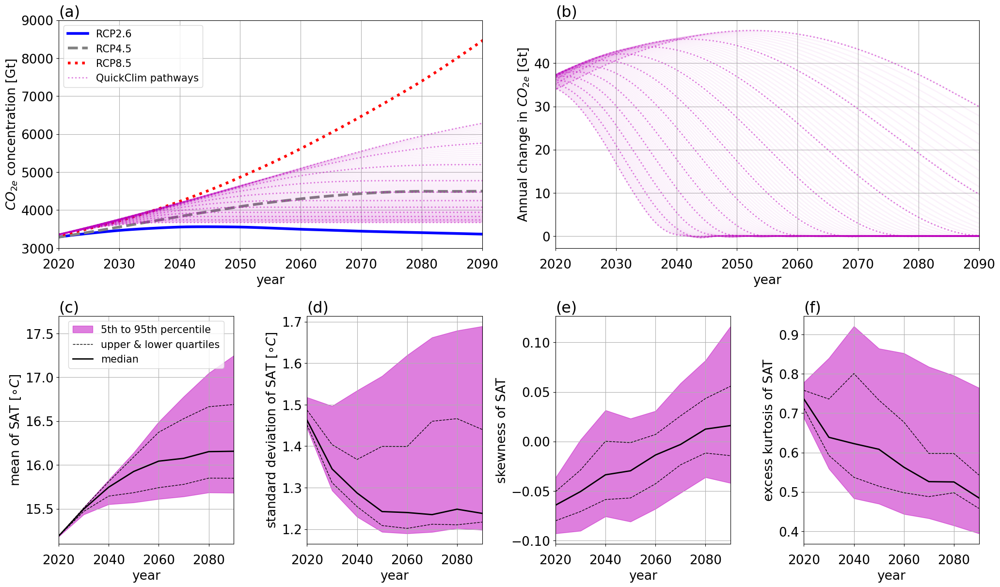

In [47]:
# plot

plt.rcParams['font.size'] = 19

fig=plt.figure()
gs = matplotlib.gridspec.GridSpec(ncols=4, nrows=5, figure=fig)

this_years = ds_mean_tas_global.time.groupby('time.year').mean('time').year.values.astype(int)
xmin,xmax=ds_RCP.time.values[14],ds_RCP.time.values[84]

#=====================================================
plt.subplot(gs[0,:2])
plt.title('(a)', loc='left')
plt.plot(ds_RCP.time.values, ds_RCP.concentration.sel(exp=2.6).values, 'b-', label='RCP2.6', lw=4)
plt.plot(ds_RCP.time.values, ds_RCP.concentration.sel(exp=4.5).values, '--', color='gray', label='RCP4.5', lw=4)
plt.plot(ds_RCP.time.values, ds_RCP.concentration.sel(exp=8.5).values, 'r:', label='RCP8.5', lw=4)
plt.plot(ds_concentration_annual.time.values, ds_concentration_annual.concentration.values[:,0]*0, 'm-', alpha=1)
plt.plot(ds_concentration_annual.time.values, ds_concentration_annual.concentration.values[:,:], 'm-', alpha=0.05)
plt.plot(ds_concentration_annual.time.values, ds_concentration_annual.concentration.values[:,::10], 'm:', alpha=0.5)
plt.plot(ds_concentration_annual.time.values, ds_concentration_annual.concentration.values[:,-1], 'm:', alpha=0.5, label='QuickClim pathways')
plt.ylabel('$CO_{2e}$ concentration [Gt]')
plt.ylim(3e3,9e3)
plt.xlim(xmin,xmax)
plt.grid()
plt.legend(loc='upper left', fontsize=15)
plt.xlabel('year') ; 

#=====================================================
plt.subplot(gs[0,2:])
plt.title('(b)', loc='left')
plt.plot(ds_concentration_annual.time.values, ds_concentration_annual.concentration_d1.values, 'm-', alpha=0.05)
plt.plot(ds_concentration_annual.time.values, ds_concentration_annual.concentration_d1.values[:,::10], 'm:', alpha=0.5)
plt.plot(ds_concentration_annual.time.values, ds_concentration_annual.concentration_d1.values[:,-1], 'm:', alpha=0.5)
plt.ylabel('Annual change in $CO_{2e}$ [Gt]')
plt.xlim(xmin,xmax)
plt.grid()
plt.xlabel('year') ; 

#=====================================================
plt.subplot(gs[1,0])
plt.title('(c)', loc='left') ; plt.ylabel('mean of SAT [$\circ C$]')
data = ds_mean_tas_global.tas.values
plt.fill_between(this_years, np.mean(np.quantile(data,0.05,axis=1),axis=0), np.mean(np.quantile(data,0.95,axis=1),axis=0), alpha=0.5, color='m', label='5th to 95th percentile')
plt.plot(this_years, np.mean(np.quantile(data,0.75,axis=1),axis=0), 'k--', lw=1, label='upper & lower quartiles')
plt.plot(this_years, np.mean(np.quantile(data,0.25,axis=1),axis=0), 'k--', lw=1)
plt.plot(this_years, np.mean(np.median(data,axis=1),axis=0), 'k-', lw=2, label='median')
plt.ylim(15.1,17.7)
del data
plt.xlabel('year') ; plt.xlim(this_years[0],this_years[-1])
plt.grid()
plt.legend(loc='upper center', fontsize=15)

#========================================================
plt.subplot(gs[1,1])
plt.title('(d)', loc='left') ; plt.ylabel('standard deviation of SAT [$\circ C$]')
data = np.sqrt(ds_var_tas_global.tas.values)
plt.fill_between(this_years, np.mean(np.quantile(data,0.05,axis=1),axis=0), np.mean(np.quantile(data,0.95,axis=1),axis=0), alpha=0.5, color='m')
plt.plot(this_years, np.mean(np.median(data,axis=1),axis=0), 'k-', lw=2)
plt.plot(this_years, np.mean(np.quantile(data,0.75,axis=1),axis=0), 'k--', lw=1)
plt.plot(this_years, np.mean(np.quantile(data,0.25,axis=1),axis=0), 'k--', lw=1)
del data
plt.xlabel('year') ; plt.xlim(this_years[0],this_years[-1])
plt.grid()

#========================================================
plt.subplot(gs[1,2])
plt.title('(e)', loc='left') ; plt.ylabel('skewness of SAT')
data = ds_skewness_tas_global.tas.values
plt.fill_between(this_years, np.mean(np.quantile(data,0.05,axis=1),axis=0), np.mean(np.quantile(data,0.95,axis=1),axis=0), alpha=0.5, color='m')
plt.plot(this_years, np.mean(np.median(data,axis=1),axis=0), 'k-', lw=2)
plt.plot(this_years, np.mean(np.quantile(data,0.75,axis=1),axis=0), 'k--', lw=1)
plt.plot(this_years, np.mean(np.quantile(data,0.25,axis=1),axis=0), 'k--', lw=1)
del data
plt.xlabel('year') ; plt.xlim(this_years[0],this_years[-1])
plt.grid()

#========================================================
plt.subplot(gs[1,3])
plt.title('(f)', loc='left') ; plt.ylabel('excess kurtosis of SAT')
data = ds_kurtosis_tas_global.tas.values
plt.fill_between(this_years, np.mean(np.quantile(data,0.05,axis=1),axis=0), np.mean(np.quantile(data,0.95,axis=1),axis=0), alpha=0.5, color='m')
plt.plot(this_years, np.mean(np.median(data,axis=1),axis=0), 'k-', lw=2)
plt.plot(this_years, np.mean(np.quantile(data,0.75,axis=1),axis=0), 'k--', lw=1)
plt.plot(this_years, np.mean(np.quantile(data,0.25,axis=1),axis=0), 'k--', lw=1)
plt.xlabel('year') ; plt.xlim(this_years[0],this_years[-1])
plt.grid()

plt.tight_layout()

fig.savefig(images_dir+'/case_study1_timeseries.pdf',bbox_inches='tight',dpi=400)

In [48]:
del ds_RCP, ds_concentration_annual, ds_mean_tas_global, ds_var_tas_global, ds_skewness_tas_global, ds_kurtosis_tas_global

## Figure 3 - case study 1 WBGT maps 

In [49]:
ds_mean_wbgt_high = xr.open_dataset(results_dir+"/case_study_1/ds_mean_wbgt_high.nc")
ds_mean_wbgt_low  = xr.open_dataset(results_dir+"/case_study_1/ds_mean_wbgt_low.nc")

ds_var_wbgt_high = xr.open_dataset(results_dir+"/case_study_1/ds_var_wbgt_high.nc")
ds_var_wbgt_low  = xr.open_dataset(results_dir+"/case_study_1/ds_var_wbgt_low.nc")

ds_skewness_wbgt_high = xr.open_dataset(results_dir+"/case_study_1/ds_skewness_wbgt_high.nc")
ds_skewness_wbgt_low  = xr.open_dataset(results_dir+"/case_study_1/ds_skewness_wbgt_low.nc")

ds_kurtosis_wbgt_high = xr.open_dataset(results_dir+"/case_study_1/ds_kurtosis_wbgt_high.nc")
ds_kurtosis_wbgt_low  = xr.open_dataset(results_dir+"/case_study_1/ds_kurtosis_wbgt_low.nc")

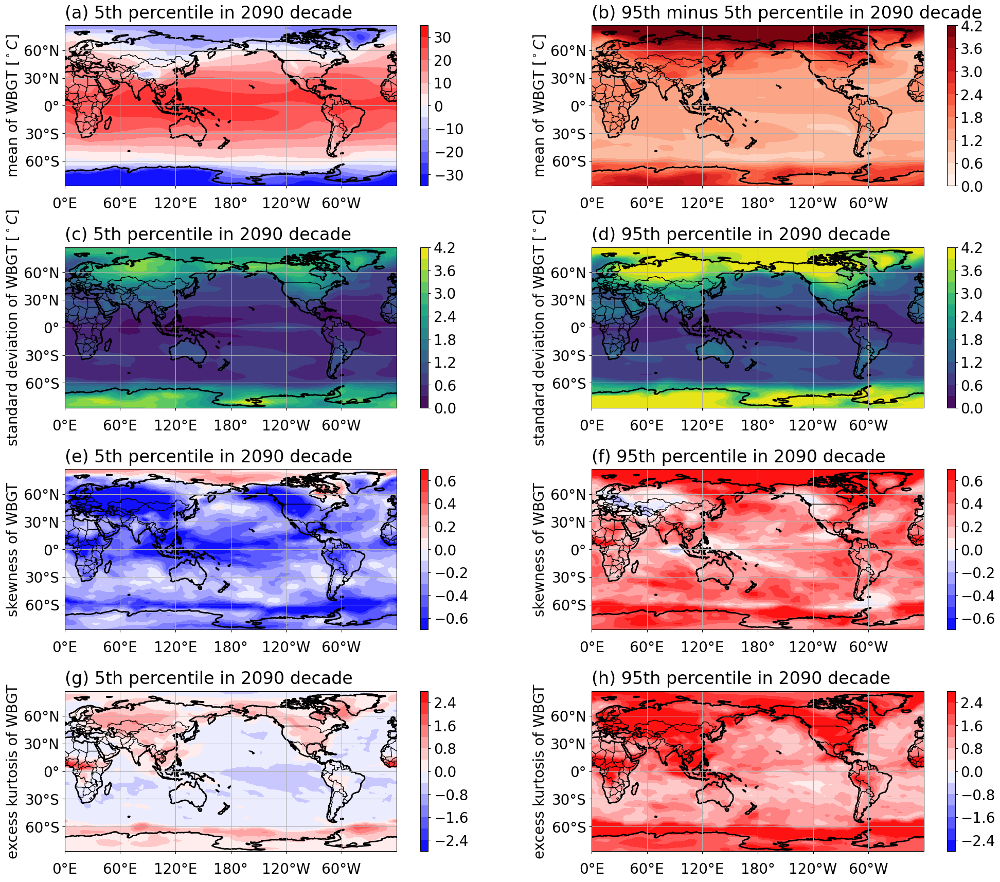

In [50]:
# plot

plt.rcParams['font.size'] = 20

fig=plt.figure()

map_var_name = 'T_wbgt_post'

lat=ds_mean_wbgt_high.lat
lon=ds_mean_wbgt_high.lon ; lon.values[-1] = 180

central_longitude=180
map_date='2090-01-01'

low = ds_mean_wbgt_low.sel(time=map_date)[map_var_name].values.T
high = ds_mean_wbgt_high.sel(time=map_date)[map_var_name].values.T
ax=plt.subplot(7,2,1,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(a) 5th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('mean of WBGT [$^\circ C$]')
h=plot_field(low, lon=lon, lat=lat, cmap=plt.cm.bwr, minC=-35, maxC=35, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')
ax=plt.subplot(7,2,2,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(b) 95th minus 5th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('mean of WBGT [$^\circ C$]')
h=plot_field(high-low, lon=lon, lat=lat, cmap=plt.cm.Reds, minC=0, maxC=4.2, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')


low = np.sqrt(ds_var_wbgt_low.sel(time=map_date)[map_var_name].values.T)
high = np.sqrt(ds_var_wbgt_high.sel(time=map_date)[map_var_name].values.T)
ax=plt.subplot(7,2,3,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(c) 5th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('standard deviation of WBGT [$^\circ C$]')
h=plot_field(low, lon=lon, lat=lat, cmap=plt.cm.viridis, minC=0, maxC=4.2, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')
ax=plt.subplot(7,2,4,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(d) 95th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('standard deviation of WBGT [$^\circ C$]')
h=plot_field(high, lon=lon, lat=lat, cmap=plt.cm.viridis, minC=0, maxC=4.2, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')


low = ds_skewness_wbgt_low.sel(time=map_date)[map_var_name].values.T
high = ds_skewness_wbgt_high.sel(time=map_date)[map_var_name].values.T
ax=plt.subplot(7,2,5,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(e) 5th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('skewness of WBGT')
h=plot_field(low, lon=lon, lat=lat, cmap=plt.cm.bwr, minC=-0.7, maxC=0.7, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')
ax=plt.subplot(7,2,6,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(f) 95th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('skewness of WBGT')
h=plot_field(high, lon=lon, lat=lat, cmap=plt.cm.bwr, minC=-0.7, maxC=0.7, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')


low = ds_kurtosis_wbgt_low.sel(time=map_date)[map_var_name].values.T
high = ds_kurtosis_wbgt_high.sel(time=map_date)[map_var_name].values.T
ax=plt.subplot(7,2,7,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(g) 5th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('excess kurtosis of WBGT')
h=plot_field(low, lon=lon, lat=lat, cmap=plt.cm.bwr, minC=-2.8, maxC=2.8, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')
ax=plt.subplot(7,2,8,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(h) 95th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('excess kurtosis of WBGT')
h=plot_field(high, lon=lon, lat=lat, cmap=plt.cm.bwr, minC=-2.8, maxC=2.8, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')


plt.tight_layout()

fig.savefig(images_dir+'/case_study1_maps.pdf',bbox_inches='tight',dpi=400)

In [51]:
del ds_mean_wbgt_high, ds_mean_wbgt_low, ds_var_wbgt_high, ds_var_wbgt_low, ds_skewness_wbgt_high, ds_skewness_wbgt_low, ds_kurtosis_wbgt_high, ds_kurtosis_wbgt_low

## Figure 4 - case study 2 global surface air temperature statistics

In [52]:
ds_RCP = xr.open_dataset(data_dir+"/ds_RCP_annual.nc")

ds_concentration_annual = xr.open_dataset(results_dir+"/case_study_2/ds_concentration_annual.nc")
ds_concentration_annual['concentration_d1'] = ds_concentration_annual.concentration.diff(dim='time')

ds_mean_tas_global = xr.open_dataset(results_dir+"/case_study_2/ds_mean_tas_global.nc")
ds_var_tas_global = xr.open_dataset(results_dir+"/case_study_2/ds_var_tas_global.nc")
ds_skewness_tas_global = xr.open_dataset(results_dir+"/case_study_2/ds_skewness_tas_global.nc")
ds_kurtosis_tas_global = xr.open_dataset(results_dir+"/case_study_2/ds_kurtosis_tas_global.nc")

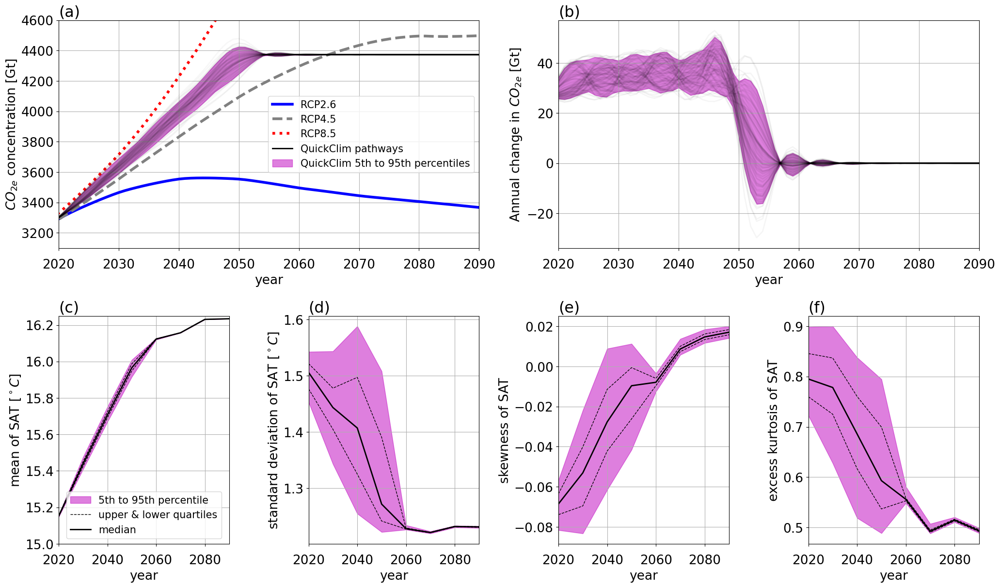

In [53]:
# plot

plt.rcParams['font.size'] = 19

fig=plt.figure()
gs = matplotlib.gridspec.GridSpec(ncols=4, nrows=5, figure=fig)

this_years = ds_mean_tas_global.time.groupby('time.year').mean('time').year.values.astype(int)
xmin,xmax=ds_RCP.time.values[14],ds_RCP.time.values[84]
         
#===========================================
plt.subplot(gs[0,:2])
plt.title('(a)', loc='left')
plt.plot(ds_RCP.time.values, ds_RCP.concentration.sel(exp=2.6).values, 'b-', label='RCP2.6', lw=4)
plt.plot(ds_RCP.time.values, ds_RCP.concentration.sel(exp=4.5).values, '--', color='gray', label='RCP4.5', lw=4)
plt.plot(ds_RCP.time.values, ds_RCP.concentration.sel(exp=8.5).values, 'r:', label='RCP8.5', lw=4)
plt.plot(ds_concentration_annual.time.values, ds_concentration_annual.concentration.values[:,0]*0, 'k-', alpha=1, label='QuickClim pathways')
plt.fill_between(ds_concentration_annual.time.values, np.quantile(ds_concentration_annual.concentration.values,0.05,axis=1), \
                 np.quantile(ds_concentration_annual.concentration.values,0.95,axis=1), alpha=0.5, color='m', label='QuickClim 5th to 95th percentiles')
plt.plot(ds_concentration_annual.time.values, ds_concentration_annual.concentration.values, 'k-', alpha=0.03)
plt.ylabel('$CO_{2e}$ concentration [Gt]')
plt.xlabel('year')
plt.ylim(3100,4600)
plt.xlim(xmin,xmax)
plt.grid()
plt.legend(loc='center right', fontsize=15)

#===========================================
plt.subplot(gs[0,2:])
plt.title('(b)', loc='left')
plt.fill_between(ds_concentration_annual.time.values, np.quantile(ds_concentration_annual.concentration_d1.values,0.05,axis=1), \
                 np.quantile(ds_concentration_annual.concentration_d1.values,0.95,axis=1), alpha=0.5, color='m', label='QuickClim 5th to 95th percentiles')
plt.plot(ds_concentration_annual.time.values, ds_concentration_annual.concentration_d1.values, 'k-', alpha=0.04)
plt.ylabel('Annual change in $CO_{2e}$ [Gt]')
plt.xlabel('year')
plt.xlim(xmin,xmax)
plt.grid()

#===========================================
plt.subplot(gs[1,0])
plt.title('(c)', loc='left') ; plt.ylabel('mean of SAT [$^\circ C$]')
data = ds_mean_tas_global.tas.values
plt.fill_between(this_years, np.mean(np.quantile(data,0.05,axis=1),axis=0), np.mean(np.quantile(data,0.95,axis=1),axis=0), alpha=0.5, color='m', label='5th to 95th percentile')
plt.plot(this_years, np.mean(np.quantile(data,0.75,axis=1),axis=0), 'k--', lw=1, label='upper & lower quartiles')
plt.plot(this_years, np.mean(np.quantile(data,0.25,axis=1),axis=0), 'k--', lw=1)
plt.plot(this_years, np.mean(np.median(data,axis=1),axis=0), 'k-', lw=2, label='median')
plt.ylim(15,16.25)
del data
plt.xlabel('year') ; plt.xlim(this_years[0],this_years[-1])
plt.legend(fontsize=15, loc='lower center')
plt.grid()

#===========================================
plt.subplot(gs[1,1])
plt.title('(d)', loc='left') ; plt.ylabel('standard deviation of SAT [$^\circ C$]')
data = np.sqrt(ds_var_tas_global.tas.values)
plt.fill_between(this_years, np.mean(np.quantile(data,0.05,axis=1),axis=0), np.mean(np.quantile(data,0.95,axis=1),axis=0), alpha=0.5, color='m')
plt.plot(this_years, np.mean(np.median(data,axis=1),axis=0), 'k-', lw=2)
plt.plot(this_years, np.mean(np.quantile(data,0.75,axis=1),axis=0), 'k--', lw=1)
plt.plot(this_years, np.mean(np.quantile(data,0.25,axis=1),axis=0), 'k--', lw=1)
del data
plt.xlabel('year') ; plt.xlim(this_years[0],this_years[-1])
plt.grid()

#===========================================
plt.subplot(gs[1,2])
plt.title('(e)', loc='left') ; plt.ylabel('skewness of SAT')
data = ds_skewness_tas_global.tas.values
plt.fill_between(this_years, np.mean(np.quantile(data,0.05,axis=1),axis=0), np.mean(np.quantile(data,0.95,axis=1),axis=0), alpha=0.5, color='m')
plt.plot(this_years, np.mean(np.median(data,axis=1),axis=0), 'k-', lw=2)
plt.plot(this_years, np.mean(np.quantile(data,0.75,axis=1),axis=0), 'k--', lw=1)
plt.plot(this_years, np.mean(np.quantile(data,0.25,axis=1),axis=0), 'k--', lw=1)
del data
plt.xlabel('year') ; plt.xlim(this_years[0],this_years[-1]) 
plt.grid()

#===========================================
plt.subplot(gs[1,3])
plt.title('(f)', loc='left') ; plt.ylabel('excess kurtosis of SAT')
data = ds_kurtosis_tas_global.tas.values
plt.fill_between(this_years, np.mean(np.quantile(data,0.05,axis=1),axis=0), np.mean(np.quantile(data,0.95,axis=1),axis=0), alpha=0.5, color='m')
plt.plot(this_years, np.mean(np.median(data,axis=1),axis=0), 'k-', lw=2)
plt.plot(this_years, np.mean(np.quantile(data,0.75,axis=1),axis=0), 'k--', lw=1)
plt.plot(this_years, np.mean(np.quantile(data,0.25,axis=1),axis=0), 'k--', lw=1)
plt.xlabel('year') ; plt.xlim(this_years[0],this_years[-1]) 
plt.grid()

plt.tight_layout()

fig.savefig(images_dir+'/case_study2_timeseries.pdf',bbox_inches='tight',dpi=400)

In [54]:
del ds_RCP, ds_concentration_annual, ds_mean_tas_global, ds_var_tas_global, ds_skewness_tas_global, ds_kurtosis_tas_global

## Figure 5 - case study 3 global surface air temperature statistics

In [55]:
ds_RCP = xr.open_dataset(data_dir+"/ds_RCP_annual.nc")

ds_concentration_annual = xr.open_dataset(results_dir+"/case_study_3/ds_concentration_annual.nc")
ds_concentration_annual['concentration_d1'] = ds_concentration_annual.concentration.diff(dim='time')

ds_mean_tas_global = xr.open_dataset(results_dir+"/case_study_3/ds_mean_tas_global.nc")
ds_var_tas_global = xr.open_dataset(results_dir+"/case_study_3/ds_var_tas_global.nc")
ds_skewness_tas_global = xr.open_dataset(results_dir+"/case_study_3/ds_skewness_tas_global.nc")
ds_kurtosis_tas_global = xr.open_dataset(results_dir+"/case_study_3/ds_kurtosis_tas_global.nc")

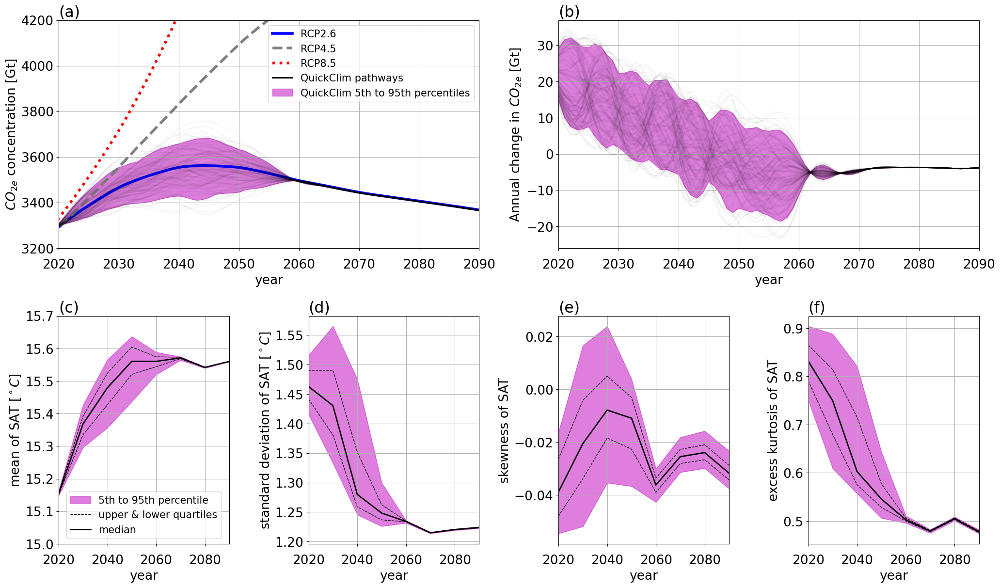

In [56]:
# plot

plt.rcParams['font.size'] = 19

fig=plt.figure()
gs = matplotlib.gridspec.GridSpec(ncols=4, nrows=5, figure=fig)

this_years = ds_mean_tas_global.time.groupby('time.year').mean('time').year.values.astype(int)
xmin,xmax=ds_RCP.time.values[14],ds_RCP.time.values[84]
         
#===========================================
plt.subplot(gs[0,:2])
plt.title('(a)', loc='left')
plt.plot(ds_RCP.time.values, ds_RCP.concentration.sel(exp=2.6).values, 'b-', label='RCP2.6', lw=4)
plt.plot(ds_RCP.time.values, ds_RCP.concentration.sel(exp=4.5).values, '--', color='gray', label='RCP4.5', lw=4)
plt.plot(ds_RCP.time.values, ds_RCP.concentration.sel(exp=8.5).values, 'r:', label='RCP8.5', lw=4)
plt.plot(ds_concentration_annual.time.values, ds_concentration_annual.concentration.values[:,0]*0, 'k-', alpha=1, label='QuickClim pathways')
plt.fill_between(ds_concentration_annual.time.values, np.quantile(ds_concentration_annual.concentration.values,0.05,axis=1), \
                 np.quantile(ds_concentration_annual.concentration.values,0.95,axis=1), alpha=0.5, color='m', label='QuickClim 5th to 95th percentiles')
plt.plot(ds_concentration_annual.time.values, ds_concentration_annual.concentration.values, 'k-', alpha=0.03)
plt.ylabel('$CO_{2e}$ concentration [Gt]')
plt.xlabel('year')
plt.ylim(3200,4200)
plt.xlim(xmin,xmax)
plt.grid()
plt.legend(loc='upper right', fontsize=15)

#===========================================
plt.subplot(gs[0,2:])
plt.title('(b)', loc='left')
plt.fill_between(ds_concentration_annual.time.values, np.quantile(ds_concentration_annual.concentration_d1.values,0.05,axis=1), \
                 np.quantile(ds_concentration_annual.concentration_d1.values,0.95,axis=1), alpha=0.5, color='m', label='QuickClim 5th to 95th percentiles')
plt.plot(ds_concentration_annual.time.values, ds_concentration_annual.concentration_d1.values, 'k-', alpha=0.04)
plt.ylabel('Annual change in $CO_{2e}$ [Gt]')
plt.xlabel('year')
plt.xlim(xmin,xmax)
plt.grid()

#===========================================
plt.subplot(gs[1,0])
plt.title('(c)', loc='left') ; plt.ylabel('mean of SAT [$^\circ C$]')
data = ds_mean_tas_global.tas.values
plt.fill_between(this_years, np.mean(np.quantile(data,0.05,axis=1),axis=0), np.mean(np.quantile(data,0.95,axis=1),axis=0), alpha=0.5, color='m', label='5th to 95th percentile')
plt.plot(this_years, np.mean(np.quantile(data,0.75,axis=1),axis=0), 'k--', lw=1, label='upper & lower quartiles')
plt.plot(this_years, np.mean(np.quantile(data,0.25,axis=1),axis=0), 'k--', lw=1)
plt.plot(this_years, np.mean(np.median(data,axis=1),axis=0), 'k-', lw=2, label='median')
plt.ylim(15,15.7)
del data
plt.xlabel('year') ; plt.xlim(this_years[0],this_years[-1])
plt.legend(fontsize=15, loc='lower center')
plt.grid()

#===========================================
plt.subplot(gs[1,1])
plt.title('(d)', loc='left') ; plt.ylabel('standard deviation of SAT [$^\circ C$]')
data = np.sqrt(ds_var_tas_global.tas.values)
plt.fill_between(this_years, np.mean(np.quantile(data,0.05,axis=1),axis=0), np.mean(np.quantile(data,0.95,axis=1),axis=0), alpha=0.5, color='m')
plt.plot(this_years, np.mean(np.median(data,axis=1),axis=0), 'k-', lw=2)
plt.plot(this_years, np.mean(np.quantile(data,0.75,axis=1),axis=0), 'k--', lw=1)
plt.plot(this_years, np.mean(np.quantile(data,0.25,axis=1),axis=0), 'k--', lw=1)
del data
plt.xlabel('year') ; plt.xlim(this_years[0],this_years[-1])
plt.grid()

#===========================================
plt.subplot(gs[1,2])
plt.title('(e)', loc='left') ; plt.ylabel('skewness of SAT')
data = ds_skewness_tas_global.tas.values
plt.fill_between(this_years, np.mean(np.quantile(data,0.05,axis=1),axis=0), np.mean(np.quantile(data,0.95,axis=1),axis=0), alpha=0.5, color='m')
plt.plot(this_years, np.mean(np.median(data,axis=1),axis=0), 'k-', lw=2)
plt.plot(this_years, np.mean(np.quantile(data,0.75,axis=1),axis=0), 'k--', lw=1)
plt.plot(this_years, np.mean(np.quantile(data,0.25,axis=1),axis=0), 'k--', lw=1)
del data
plt.xlabel('year') ; plt.xlim(this_years[0],this_years[-1])
plt.grid()

#===========================================
plt.subplot(gs[1,3])
plt.title('(f)', loc='left') ; plt.ylabel('excess kurtosis of SAT')
data = ds_kurtosis_tas_global.tas.values
plt.fill_between(this_years, np.mean(np.quantile(data,0.05,axis=1),axis=0), np.mean(np.quantile(data,0.95,axis=1),axis=0), alpha=0.5, color='m')
plt.plot(this_years, np.mean(np.median(data,axis=1),axis=0), 'k-', lw=2)
plt.plot(this_years, np.mean(np.quantile(data,0.75,axis=1),axis=0), 'k--', lw=1)
plt.plot(this_years, np.mean(np.quantile(data,0.25,axis=1),axis=0), 'k--', lw=1)
plt.xlabel('year') ; plt.xlim(this_years[0],this_years[-1]) 
plt.grid()

plt.tight_layout()

fig.savefig(images_dir+'/case_study3_timeseries.pdf',bbox_inches='tight',dpi=400)

In [57]:
del ds_RCP, ds_concentration_annual, ds_mean_tas_global, ds_var_tas_global, ds_skewness_tas_global, ds_kurtosis_tas_global

## Supplementary Figure 1 - regional averages case study 1

In [58]:
ds_final_region_rolling_mean_decade_all = xr.open_dataset(results_dir+"/case_study_1/ds_final_region_rolling_mean_decade_all.nc")
ds_final_region_rolling_var_decade_all = xr.open_dataset(results_dir+"/case_study_1/ds_final_region_rolling_var_decade_all.nc")
ds_final_region_rolling_skewness_decade_all = xr.open_dataset(results_dir+"/case_study_1/ds_final_region_rolling_skewness_decade_all.nc")
ds_final_region_rolling_kurtosis_decade_all = xr.open_dataset(results_dir+"/case_study_1/ds_final_region_rolling_kurtosis_decade_all.nc")

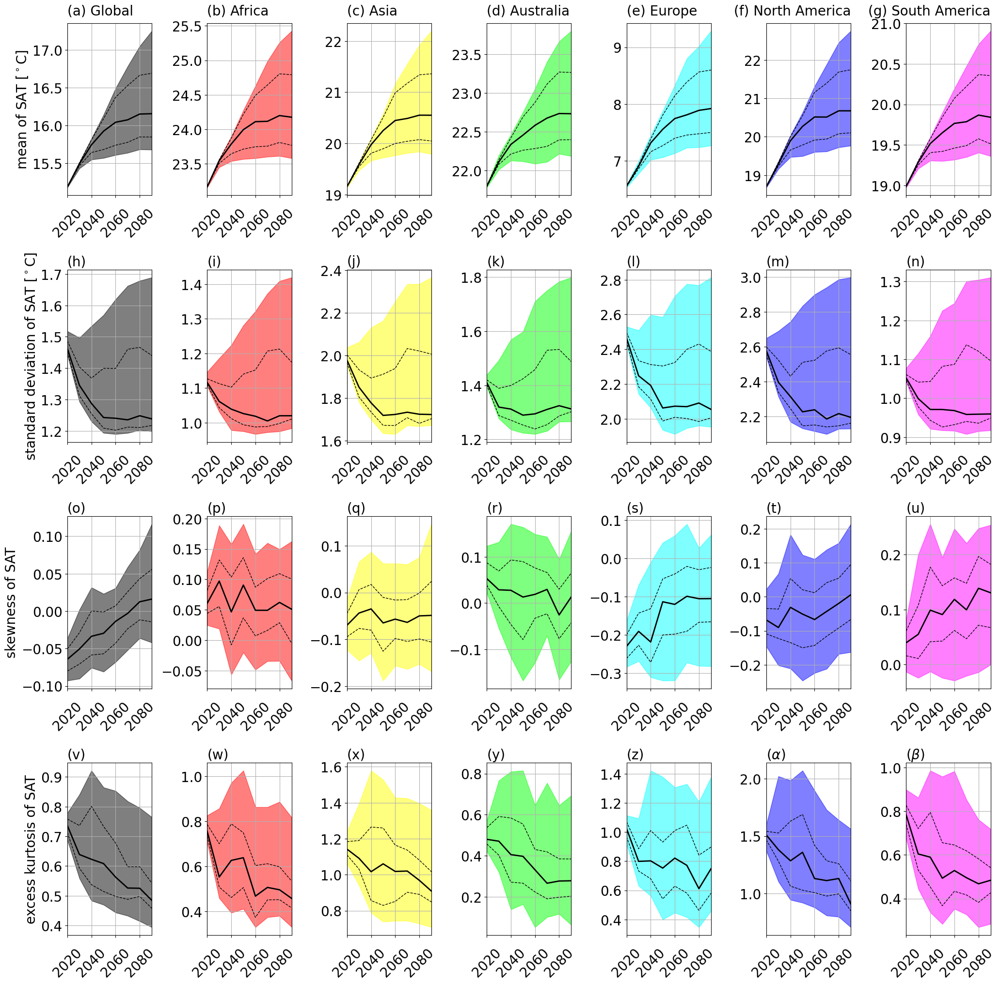

In [59]:
# plot

var_name='tas'

region_plot_list = ['Global', 'Africa', 'Asia', 'Australia', 'Europe', 'North America', 'South America']

xmin=2020 ; xmax=2090

stats = dict()
stats['mean'] = ds_final_region_rolling_mean_decade_all
stats['standard deviation'] = np.sqrt(ds_final_region_rolling_var_decade_all)
stats['skewness'] = ds_final_region_rolling_skewness_decade_all
stats['excess kurtosis'] = ds_final_region_rolling_kurtosis_decade_all

fig=plt.figure()
fontsize=20
plt.rcParams['font.size'] = fontsize

cmap = generate_colours_dict(region_plot_list[1:])
cmap['Global'] = 'k'

greek_letters = ['$\\alpha$', '$\\beta$', '$\\gamma$', '$\\delta$', '$\\epsilon$', '$\\zeta$']

this_years = ds_final_region_rolling_mean_decade_all.time.groupby('time.year').mean('time').year.values.astype(int)

for ii,region in enumerate(region_plot_list):
    for jj,key in enumerate(list(stats.keys())):
        pos = 1+7*jj+ii
        ax=plt.subplot(6,7,pos)
        
        if ii==0:
            if key in ['mean', 'standard deviation']:
                plt.ylabel('{0} of SAT [$^\circ$C]'.format(key))
            else:
                plt.ylabel('{0} of SAT'.format(key))
            
        data = stats[key].sel(region=region)[var_name].values
        plt.fill_between(this_years, np.mean(np.quantile(data,0.05,axis=1),axis=0), np.mean(np.quantile(data,0.95,axis=1),axis=0), alpha=0.5, color=cmap[region])
        plt.plot(this_years, np.mean(np.median(data,axis=1),axis=0), 'k-', lw=2)
        plt.plot(this_years, np.mean(np.quantile(data,0.75,axis=1),axis=0), 'k--', lw=1)
        plt.plot(this_years, np.mean(np.quantile(data,0.25,axis=1),axis=0), 'k--', lw=1)
        del data
        
        ax.set_xticks(this_years) ; plt.xlim(xmin,xmax) ; plt.grid()    
        
        if jj==0:
            if region == 'North America':
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='right', fontsize=fontsize, pad=12)
            elif region == 'South America':
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='right', fontsize=fontsize, pad=12)
            elif region == 'Antarctica':
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='right', fontsize=fontsize, pad=12)
            else:
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='left', fontsize=fontsize, pad=12)
        else:
            if pos<=26:
                plt.title('({0})'.format(chr(96+pos)), loc='left', fontsize=fontsize)
            else:
                plt.title('({0})'.format(greek_letters[pos-27]), loc='left', fontsize=fontsize)
                
        if jj==len(list(stats.keys()))-1:
            ax.set_xticks(this_years[::2])
            ax.set_xticklabels(this_years[::2], rotation=45)
        else:
            ax.set_xticks(this_years[::2])
            ax.set_xticklabels(this_years[::2], rotation=45)
            
plt.tight_layout()

fig.savefig(images_dir+'/case_study1_regional_average.pdf',bbox_inches='tight', dpi=400)

In [60]:
del ds_final_region_rolling_mean_decade_all, ds_final_region_rolling_var_decade_all, ds_final_region_rolling_skewness_decade_all, ds_final_region_rolling_kurtosis_decade_all

## Supplementary Figure 2 - regional averages case study 2

In [61]:
ds_final_region_rolling_mean_decade_all = xr.open_dataset(results_dir+"/case_study_2/ds_final_region_rolling_mean_decade_all.nc")
ds_final_region_rolling_var_decade_all = xr.open_dataset(results_dir+"/case_study_2/ds_final_region_rolling_var_decade_all.nc")
ds_final_region_rolling_skewness_decade_all = xr.open_dataset(results_dir+"/case_study_2/ds_final_region_rolling_skewness_decade_all.nc")
ds_final_region_rolling_kurtosis_decade_all = xr.open_dataset(results_dir+"/case_study_2/ds_final_region_rolling_kurtosis_decade_all.nc")

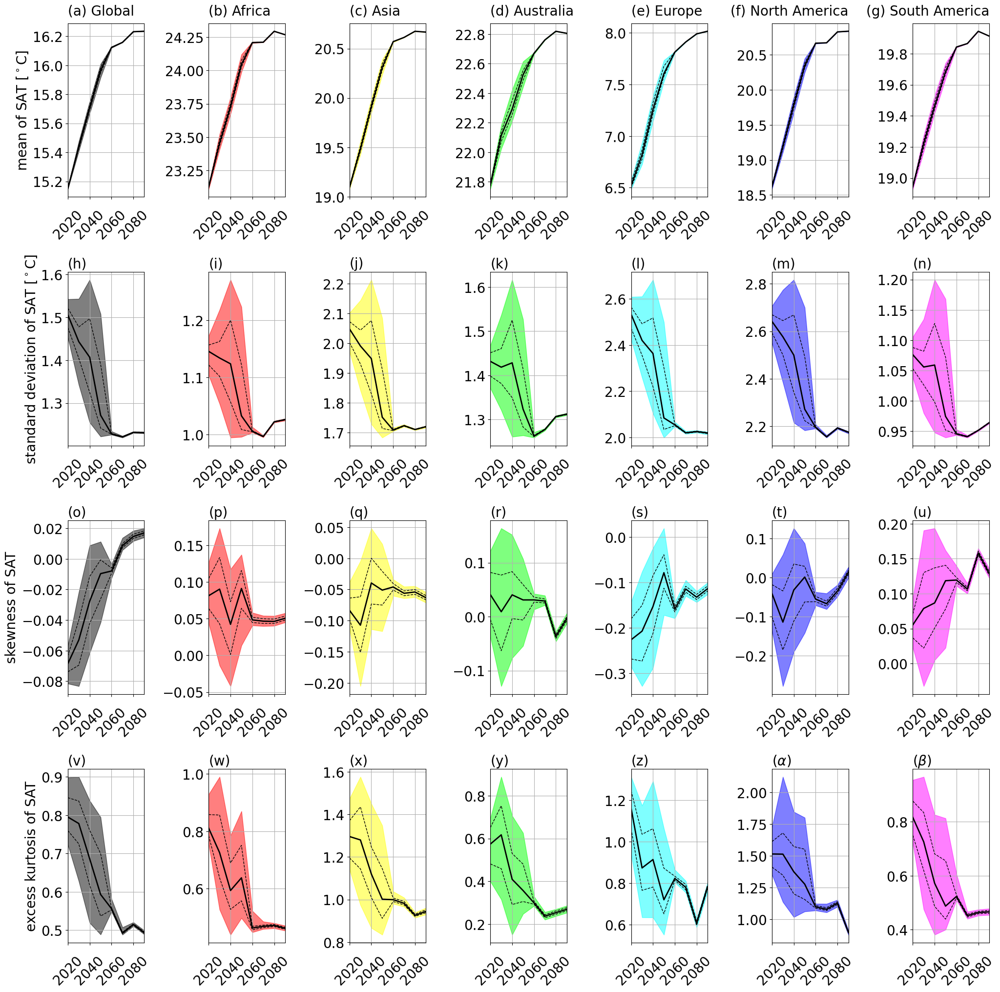

In [62]:
# plot
var_name='tas'

region_plot_list = ['Global', 'Africa', 'Asia', 'Australia', 'Europe', 'North America', 'South America']

xmin=2020 ; xmax=2090

stats = dict()
stats['mean'] = ds_final_region_rolling_mean_decade_all
stats['standard deviation'] = np.sqrt(ds_final_region_rolling_var_decade_all)
stats['skewness'] = ds_final_region_rolling_skewness_decade_all
stats['excess kurtosis'] = ds_final_region_rolling_kurtosis_decade_all

fig=plt.figure()
fontsize=20
plt.rcParams['font.size'] = fontsize

cmap = generate_colours_dict(region_plot_list[1:])
cmap['Global'] = 'k'

this_years = ds_final_region_rolling_mean_decade_all.time.groupby('time.year').mean('time').year.values.astype(int)

greek_letters = ['$\\alpha$', '$\\beta$', '$\\gamma$', '$\\delta$', '$\\epsilon$', '$\\zeta$']

for ii,region in enumerate(region_plot_list):
    for jj,key in enumerate(list(stats.keys())):
        pos = 1+7*jj+ii
        ax=plt.subplot(6,7,pos)
        
        if ii==0:
            if key in ['mean', 'standard deviation']:
                plt.ylabel('{0} of SAT [$^\circ$C]'.format(key))
            else:
                plt.ylabel('{0} of SAT'.format(key))
            
        data = stats[key].sel(region=region)[var_name].values
        plt.fill_between(this_years, np.mean(np.quantile(data,0.05,axis=1),axis=0), np.mean(np.quantile(data,0.95,axis=1),axis=0), alpha=0.5, color=cmap[region])
        plt.plot(this_years, np.mean(np.median(data,axis=1),axis=0), 'k-', lw=2)
        plt.plot(this_years, np.mean(np.quantile(data,0.75,axis=1),axis=0), 'k--', lw=1)
        plt.plot(this_years, np.mean(np.quantile(data,0.25,axis=1),axis=0), 'k--', lw=1)
        del data
        
        ax.set_xticks(this_years) ; plt.xlim(xmin,xmax) ; plt.grid()    
        
        if jj==0:
            if region == 'North America':
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='right', fontsize=fontsize, pad=12)
            elif region == 'South America':
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='right', fontsize=fontsize, pad=12)
            elif region == 'Antarctica':
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='right', fontsize=fontsize, pad=12)
            else:
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='left', fontsize=fontsize, pad=12)
        else:
            if pos<=26:
                plt.title('({0})'.format(chr(96+pos)), loc='left', fontsize=fontsize)
            else:
                plt.title('({0})'.format(greek_letters[pos-27]), loc='left', fontsize=fontsize)
                
        if jj==len(list(stats.keys()))-1:
            ax.set_xticks(this_years[::2])
            ax.set_xticklabels(this_years[::2], rotation=45)
        else:
            ax.set_xticks(this_years[::2])
            ax.set_xticklabels(this_years[::2], rotation=45)
            
plt.tight_layout()

fig.savefig(images_dir+'/case_study2_regional_average.pdf',bbox_inches='tight', dpi=400)

In [63]:
del ds_final_region_rolling_mean_decade_all, ds_final_region_rolling_var_decade_all, ds_final_region_rolling_skewness_decade_all, ds_final_region_rolling_kurtosis_decade_all

## Supplementary Figure 3 - case study 2 WBGT maps 

In [64]:
ds_mean_wbgt_high = xr.open_dataset(results_dir+"/case_study_2/ds_mean_wbgt_high.nc")
ds_mean_wbgt_low  = xr.open_dataset(results_dir+"/case_study_2/ds_mean_wbgt_low.nc")

ds_var_wbgt_high = xr.open_dataset(results_dir+"/case_study_2/ds_var_wbgt_high.nc")
ds_var_wbgt_low  = xr.open_dataset(results_dir+"/case_study_2/ds_var_wbgt_low.nc")

ds_skewness_wbgt_high = xr.open_dataset(results_dir+"/case_study_2/ds_skewness_wbgt_high.nc")
ds_skewness_wbgt_low  = xr.open_dataset(results_dir+"/case_study_2/ds_skewness_wbgt_low.nc")

ds_kurtosis_wbgt_high = xr.open_dataset(results_dir+"/case_study_2/ds_kurtosis_wbgt_high.nc")
ds_kurtosis_wbgt_low  = xr.open_dataset(results_dir+"/case_study_2/ds_kurtosis_wbgt_low.nc")

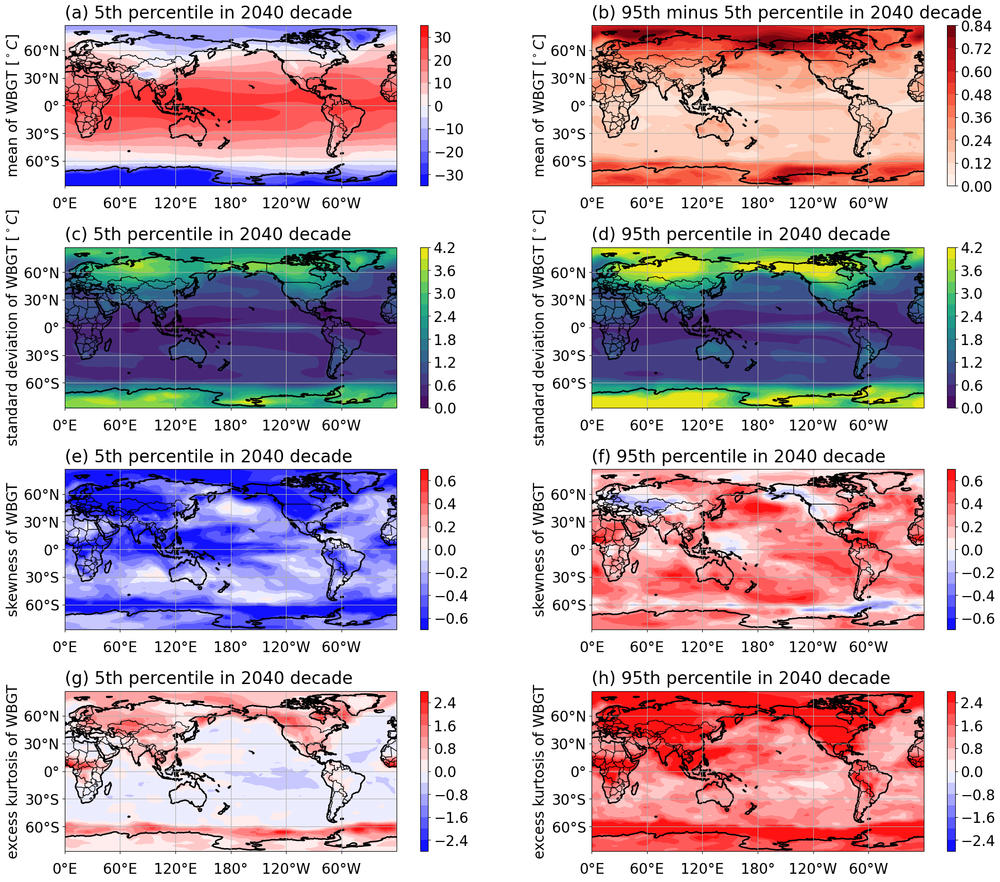

In [65]:
# plot

fontsize=20
plt.rcParams['font.size'] = fontsize

fig=plt.figure()

map_var_name = 'T_wbgt_post'

lat=ds_mean_wbgt_high.lat
lon=ds_mean_wbgt_high.lon ; lon.values[-1] = 180

central_longitude=180

map_date='2040-01-01'

low = ds_mean_wbgt_low.sel(time=map_date)[map_var_name].values.T
high = ds_mean_wbgt_high.sel(time=map_date)[map_var_name].values.T
ax=plt.subplot(7,2,1,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(a) 5th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('mean of WBGT [$^\circ C$]')
h=plot_field(low, lon=lon, lat=lat, cmap=plt.cm.bwr, minC=-35, maxC=35, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')
ax=plt.subplot(7,2,2,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(b) 95th minus 5th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('mean of WBGT [$^\circ C$]')
h=plot_field(high-low, lon=lon, lat=lat, cmap=plt.cm.Reds, minC=0, maxC=0.84, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')


low = np.sqrt(ds_var_wbgt_low.sel(time=map_date)[map_var_name].values.T)
high = np.sqrt(ds_var_wbgt_high.sel(time=map_date)[map_var_name].values.T)
ax=plt.subplot(7,2,3,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(c) 5th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('standard deviation of WBGT [$^\circ C$]')
h=plot_field(low, lon=lon, lat=lat, cmap=plt.cm.viridis, minC=0, maxC=4.2, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')
ax=plt.subplot(7,2,4,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(d) 95th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('standard deviation of WBGT [$^\circ C$]')
h=plot_field(high, lon=lon, lat=lat, cmap=plt.cm.viridis, minC=0, maxC=4.2, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')


low = ds_skewness_wbgt_low.sel(time=map_date)[map_var_name].values.T
high = ds_skewness_wbgt_high.sel(time=map_date)[map_var_name].values.T
ax=plt.subplot(7,2,5,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(e) 5th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('skewness of WBGT')
h=plot_field(low, lon=lon, lat=lat, cmap=plt.cm.bwr, minC=-0.7, maxC=0.7, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')
ax=plt.subplot(7,2,6,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(f) 95th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('skewness of WBGT')
h=plot_field(high, lon=lon, lat=lat, cmap=plt.cm.bwr, minC=-0.7, maxC=0.7, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')


low = ds_kurtosis_wbgt_low.sel(time=map_date)[map_var_name].values.T
high = ds_kurtosis_wbgt_high.sel(time=map_date)[map_var_name].values.T
ax=plt.subplot(7,2,7,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(g) 5th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('excess kurtosis of WBGT')
h=plot_field(low, lon=lon, lat=lat, cmap=plt.cm.bwr, minC=-2.8, maxC=2.8, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')
ax=plt.subplot(7,2,8,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(h) 95th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('excess kurtosis of WBGT')
h=plot_field(high, lon=lon, lat=lat, cmap=plt.cm.bwr, minC=-2.8, maxC=2.8, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')


plt.tight_layout()

fig.savefig(images_dir+'/case_study2_maps.pdf',bbox_inches='tight',dpi=400)

In [66]:
del ds_mean_wbgt_high, ds_mean_wbgt_low, ds_var_wbgt_high, ds_var_wbgt_low, ds_skewness_wbgt_high, ds_skewness_wbgt_low, ds_kurtosis_wbgt_high, ds_kurtosis_wbgt_low

## Supplementary Figure 4 - regional averages case study 3

In [67]:
ds_final_region_rolling_mean_decade_all = xr.open_dataset(results_dir+"/case_study_3/ds_final_region_rolling_mean_decade_all.nc")
ds_final_region_rolling_var_decade_all = xr.open_dataset(results_dir+"/case_study_3/ds_final_region_rolling_var_decade_all.nc")
ds_final_region_rolling_skewness_decade_all = xr.open_dataset(results_dir+"/case_study_3/ds_final_region_rolling_skewness_decade_all.nc")
ds_final_region_rolling_kurtosis_decade_all = xr.open_dataset(results_dir+"/case_study_3/ds_final_region_rolling_kurtosis_decade_all.nc")


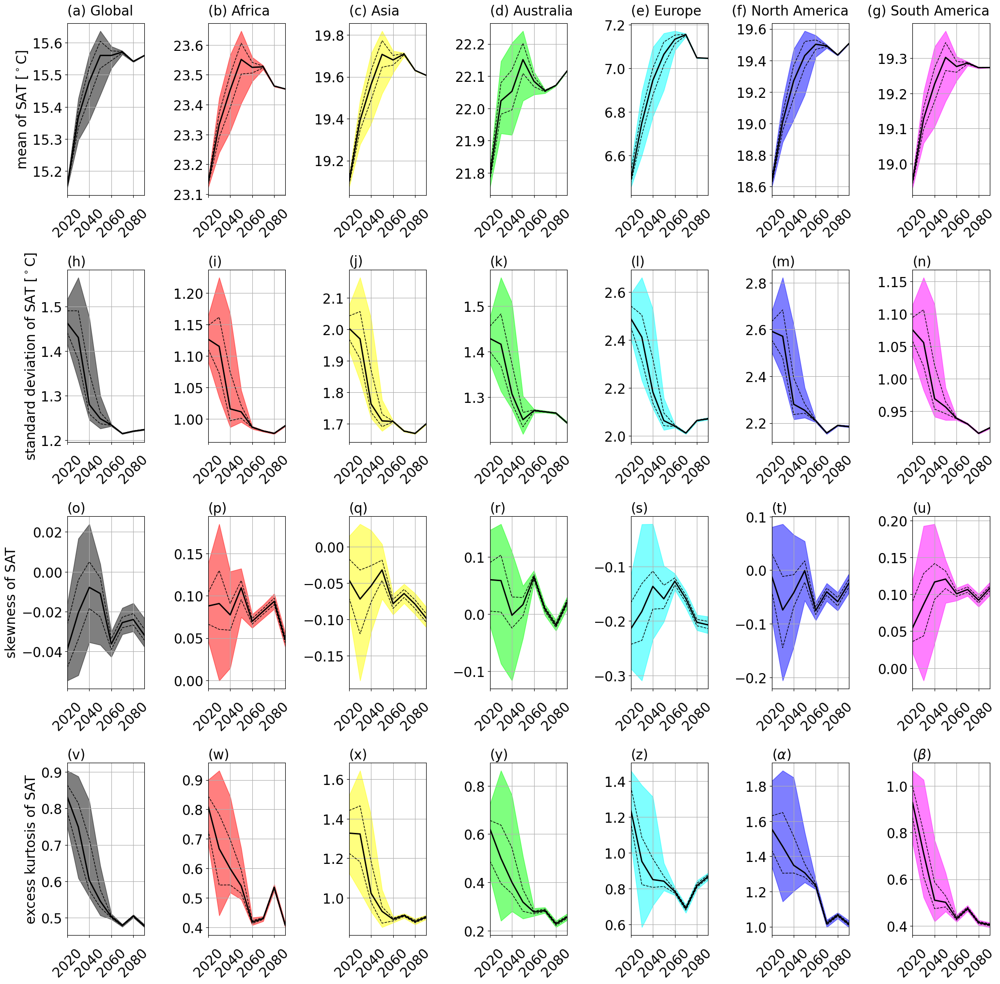

In [68]:
# plot

var_name='tas'

region_plot_list = ['Global', 'Africa', 'Asia', 'Australia', 'Europe', 'North America', 'South America']

xmin=2020 ; xmax=2090

stats = dict()
stats['mean'] = ds_final_region_rolling_mean_decade_all
stats['standard deviation'] = np.sqrt(ds_final_region_rolling_var_decade_all)
stats['skewness'] = ds_final_region_rolling_skewness_decade_all
stats['excess kurtosis'] = ds_final_region_rolling_kurtosis_decade_all

fig=plt.figure()
fontsize=20
plt.rcParams['font.size'] = fontsize

cmap = generate_colours_dict(region_plot_list[1:])
cmap['Global'] = 'k'

this_years = ds_final_region_rolling_mean_decade_all.time.groupby('time.year').mean('time').year.values.astype(int)

greek_letters = ['$\\alpha$', '$\\beta$', '$\\gamma$', '$\\delta$', '$\\epsilon$', '$\\zeta$']

for ii,region in enumerate(region_plot_list):
    for jj,key in enumerate(list(stats.keys())):
        pos = 1+7*jj+ii
        ax=plt.subplot(6,7,pos)
        
        if ii==0:
            if key in ['mean', 'standard deviation']:
                plt.ylabel('{0} of SAT [$^\circ$C]'.format(key))
            else:
                plt.ylabel('{0} of SAT'.format(key))
            
        data = stats[key].sel(region=region)[var_name].values
        plt.fill_between(this_years, np.mean(np.quantile(data,0.05,axis=1),axis=0), np.mean(np.quantile(data,0.95,axis=1),axis=0), alpha=0.5, color=cmap[region])
        plt.plot(this_years, np.mean(np.median(data,axis=1),axis=0), 'k-', lw=2)
        plt.plot(this_years, np.mean(np.quantile(data,0.75,axis=1),axis=0), 'k--', lw=1)
        plt.plot(this_years, np.mean(np.quantile(data,0.25,axis=1),axis=0), 'k--', lw=1)
        del data
        
        ax.set_xticks(this_years) ; plt.xlim(xmin,xmax) ; plt.grid()    
        
        if jj==0:
            if region == 'North America':
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='right', fontsize=fontsize, pad=12)
            elif region == 'South America':
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='right', fontsize=fontsize, pad=12)
            elif region == 'Antarctica':
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='right', fontsize=fontsize, pad=12)
            else:
                plt.title('({0}) {1}'.format(chr(97+ii), region), loc='left', fontsize=fontsize, pad=12)
        else:
            if pos<=26:
                plt.title('({0})'.format(chr(96+pos)), loc='left', fontsize=fontsize)
            else:
                plt.title('({0})'.format(greek_letters[pos-27]), loc='left', fontsize=fontsize)
                
        if jj==len(list(stats.keys()))-1:
            ax.set_xticks(this_years[::2])
            ax.set_xticklabels(this_years[::2], rotation=45)
        else:
            ax.set_xticks(this_years[::2])
            ax.set_xticklabels(this_years[::2], rotation=45)
            
plt.tight_layout()

fig.savefig(images_dir+'/case_study3_regional_average.pdf',bbox_inches='tight', dpi=400)

In [69]:
del ds_final_region_rolling_mean_decade_all, ds_final_region_rolling_var_decade_all, ds_final_region_rolling_skewness_decade_all, ds_final_region_rolling_kurtosis_decade_all

## Supplementary Figure 5 - case study 3 WBGT maps 

In [70]:
ds_mean_wbgt_high = xr.open_dataset(results_dir+"/case_study_3/ds_mean_wbgt_high.nc")
ds_mean_wbgt_low  = xr.open_dataset(results_dir+"/case_study_3/ds_mean_wbgt_low.nc")

ds_var_wbgt_high = xr.open_dataset(results_dir+"/case_study_3/ds_var_wbgt_high.nc")
ds_var_wbgt_low  = xr.open_dataset(results_dir+"/case_study_3/ds_var_wbgt_low.nc")

ds_skewness_wbgt_high = xr.open_dataset(results_dir+"/case_study_3/ds_skewness_wbgt_high.nc")
ds_skewness_wbgt_low  = xr.open_dataset(results_dir+"/case_study_3/ds_skewness_wbgt_low.nc")

ds_kurtosis_wbgt_high = xr.open_dataset(results_dir+"/case_study_3/ds_kurtosis_wbgt_high.nc")
ds_kurtosis_wbgt_low  = xr.open_dataset(results_dir+"/case_study_3/ds_kurtosis_wbgt_low.nc")

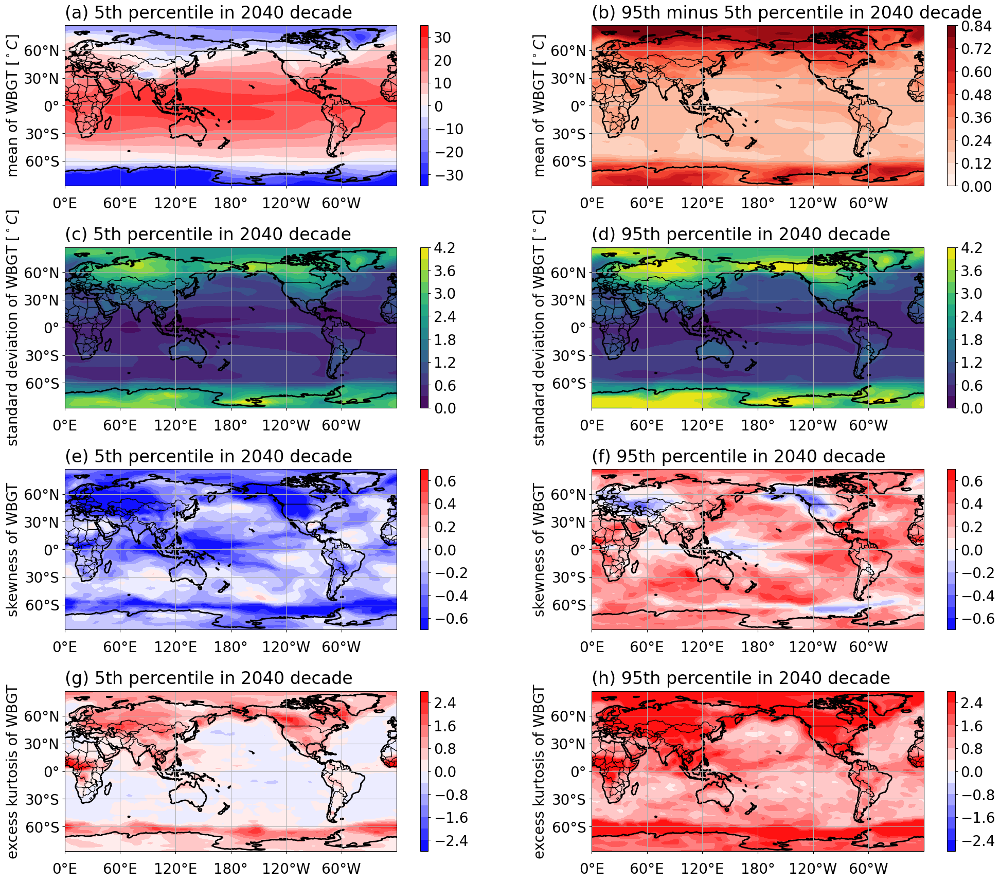

In [71]:
# plot 

plt.rcParams['font.size'] = 20

fig=plt.figure()

map_var_name = 'T_wbgt_post'

lat=ds_mean_wbgt_high.lat
lon=ds_mean_wbgt_high.lon ; lon.values[-1] = 180

central_longitude=180
map_date='2040-01-01'

low = ds_mean_wbgt_low.sel(time=map_date)[map_var_name].values.T
high = ds_mean_wbgt_high.sel(time=map_date)[map_var_name].values.T
ax=plt.subplot(7,2,1,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(a) 5th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('mean of WBGT [$^\circ C$]')
h=plot_field(low, lon=lon, lat=lat, cmap=plt.cm.bwr, minC=-35, maxC=35, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')
ax=plt.subplot(7,2,2,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(b) 95th minus 5th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('mean of WBGT [$^\circ C$]')
h=plot_field(high-low, lon=lon, lat=lat, cmap=plt.cm.Reds, minC=0, maxC=0.84, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')

low = np.sqrt(ds_var_wbgt_low.sel(time=map_date)[map_var_name].values.T)
high = np.sqrt(ds_var_wbgt_high.sel(time=map_date)[map_var_name].values.T)
ax=plt.subplot(7,2,3,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(c) 5th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('standard deviation of WBGT [$^\circ C$]')
h=plot_field(low, lon=lon, lat=lat, cmap=plt.cm.viridis, minC=0, maxC=4.2, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')
ax=plt.subplot(7,2,4,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(d) 95th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('standard deviation of WBGT [$^\circ C$]')
h=plot_field(high, lon=lon, lat=lat, cmap=plt.cm.viridis, minC=0, maxC=4.2, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')

low = ds_skewness_wbgt_low.sel(time=map_date)[map_var_name].values.T
high = ds_skewness_wbgt_high.sel(time=map_date)[map_var_name].values.T
ax=plt.subplot(7,2,5,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(e) 5th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('skewness of WBGT')
h=plot_field(low, lon=lon, lat=lat, cmap=plt.cm.bwr, minC=-0.7, maxC=0.7, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')
ax=plt.subplot(7,2,6,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(f) 95th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('skewness of WBGT')
h=plot_field(high, lon=lon, lat=lat, cmap=plt.cm.bwr, minC=-0.7, maxC=0.7, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')

low = ds_kurtosis_wbgt_low.sel(time=map_date)[map_var_name].values.T
high = ds_kurtosis_wbgt_high.sel(time=map_date)[map_var_name].values.T
ax=plt.subplot(7,2,7,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(g) 5th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('excess kurtosis of WBGT')
h=plot_field(low, lon=lon, lat=lat, cmap=plt.cm.bwr, minC=-2.8, maxC=2.8, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')
ax=plt.subplot(7,2,8,projection=ccrs.PlateCarree(central_longitude=central_longitude)) ; plt.title('(h) 95th percentile in {0} decade'.format(map_date[:4]), loc='left', pad=10) ; plt.ylabel('excess kurtosis of WBGT')
h=plot_field(high, lon=lon, lat=lat, cmap=plt.cm.bwr, minC=-2.8, maxC=2.8, num_contours=15) ; add_plot_features(fig,h,ax,tick_rotation=0, orientation='vertical')

plt.tight_layout()

fig.savefig(images_dir+'/case_study3_maps.pdf',bbox_inches='tight',dpi=400)

In [72]:
del ds_mean_wbgt_high, ds_mean_wbgt_low, ds_var_wbgt_high, ds_var_wbgt_low, ds_skewness_wbgt_high, ds_skewness_wbgt_low, ds_kurtosis_wbgt_high, ds_kurtosis_wbgt_low